                                         CAPSTONE PROJECT (Mini Project- 10)

                      Project title: Clustering the Countries by using K-means, Heirarchical and DBSCAN

Objective:To categorise the countries using socio-economic and health factors that determine the overall development of the country.

Brief on the project:   HELP International is an international humanitarian NGO that is committed to fighting poverty and providing the people of backward countries with basic amenities and relief during the time of disasters and natural calamities.HELP International specializes in four core competencies:

1. public health
2. education
3. entrepreneurship/business
4. infrastructure development projects.

Problem Statement: The scope of the project is to cluster world countries, based on socio-economic and health factors, to determine the overall development status of a country to help NGOs use their funds strategically and effectively, in order to support those nations that are at the bottom of the development curve.

Resources: 1. Dataset is downloaded from https://www.kaggle.com
           2. Python with libraries- NumPy, Pandas, matplotlib, seaborn, sklearn,SciPy etc.
               

In [1]:
import pandas as pd
import numpy as np

# For Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# For scaling the data
from sklearn.preprocessing import scale
 
#To transform data    
from scipy.stats import boxcox

import warnings
warnings.filterwarnings("ignore")

# DATA SET

In [2]:
country_ds = pd.read_csv(r'Country-data.csv',\
                        index_col='country')
country_ds.head()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
country,,,,,,,,,
Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200


In [3]:
country_ds.tail()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
country,,,,,,,,,
Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970
Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500
Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310
Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310
Zambia,83.1,37.0,5.89,30.9,3280,14.00,52.0,5.40,1460


In [4]:
country_ds.shape

(167, 9)

In [5]:
country_ds.dtypes

child_mort    float64
exports       float64
health        float64
imports       float64
income          int64
inflation     float64
life_expec    float64
total_fer     float64
gdpp            int64
dtype: object

In [6]:
country_ds.columns

Index(['child_mort', 'exports', 'health', 'imports', 'income', 'inflation',
       'life_expec', 'total_fer', 'gdpp'],
      dtype='object')

The dataset includes 10 features with information on 167 countries. Features are as follows:

country: name of the country

child_mort: death of children under 5 years of age per 1,000 live births

exports: exports of goods and services per capita. Given as % of the GDP per capita.

health: total health-related spending per capita. Given as % of GDP per capita.

imports: imports of goods and services per capita. Given as % of the GDP per capita.

income: net income per person.

Inflation: rate of increase in prices and fall in the purchasing value of money.

life_expec: the average number of years a new born child would live if the current mortality patterns are to remain the same.

total_fer: the number of children that would be born to each woman if the current age-fertility rates remain the same.

gdpp: the GDP per capita in USD (GDP divided by the total population).

All features are numeric type:  7 float and 2 integer data types

In [7]:
country_ds.describe()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
count,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000
mean,38.270060,41.108976,6.815689,46.890215,17144.688623,7.781832,70.555689,2.947964,12964.155689
std,40.328931,27.412010,2.746837,24.209589,19278.067698,10.570704,8.893172,1.513848,18328.704809
min,2.600000,0.109000,1.810000,0.065900,609.000000,-4.210000,32.100000,1.150000,231.000000
25%,8.250000,23.800000,4.920000,30.200000,3355.000000,1.810000,65.300000,1.795000,1330.000000
50%,19.300000,35.000000,6.320000,43.300000,9960.000000,5.390000,73.100000,2.410000,4660.000000
75%,62.100000,51.350000,8.600000,58.750000,22800.000000,10.750000,76.800000,3.880000,14050.000000
max,208.000000,200.000000,17.900000,174.000000,125000.000000,104.000000,82.800000,7.490000,105000.000000


After checking general dataset stats, we can confirm the dataset contain valid data:

Average life expectancy: 70.5 years

Average child mortality rate (per 1,000 live births): 38.3

Average fertility rate: 2.9

Median fertility rate: 2.4

Average GDP per capita: 12,964 USD

Average Income: 17,145 USD

# Data Cleaning

In [8]:
#Checking duplicates
country_ds.duplicated().sum()

0

In [9]:
#Checking missing values
country_ds.isnull().sum()

child_mort    0
exports       0
health        0
imports       0
income        0
inflation     0
life_expec    0
total_fer     0
gdpp          0
dtype: int64

In [10]:
# Looking for outliers
def outlier_visualizer(col, vert=True, grid=True):
    country_ds[col].plot(kind='box', vert=vert)
    plt.title('{} - Boxplot'.format(col))
    plt.ylabel('Values')
    plt.grid(grid)
    plt.show()
    
def outlier_finder(col):
    q1 = np.percentile(country_ds[col], 25)
    q3 = np.percentile(country_ds[col], 75)
    iqr = q3 - q1
    left_lim = q1 - iqr*1.5
    right_lim = q3 + iqr*1.5
    outliers = {'country':[], col:[]}

    for i,c in enumerate(country_ds[col]):
        if c < left_lim:
            outliers['country'].append(country_ds[col].index[i])
            outliers[col].append(c)
        elif c > right_lim:
            outliers['country'].append(country_ds[col].index[i])
            outliers[col].append(c)
        
    outliers_df = pd.DataFrame(outliers)
    outliers_df.set_index('country', inplace=True)
    
    print('{} - % of outliers: {}%'.format(col, round(outliers_df.shape[0]/country_ds.shape[0]*100,2)))
    return outliers_df

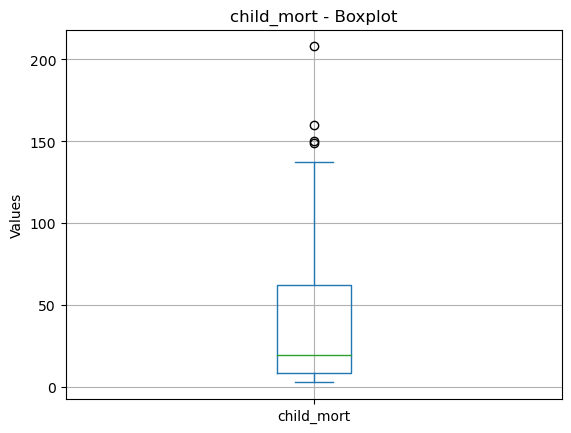

In [11]:
outlier_visualizer('child_mort')

In [12]:
outlier_finder('child_mort')

child_mort - % of outliers: 2.4%


,child_mort
country,
Central African Republic,149.0
Chad,150.0
Haiti,208.0
Sierra Leone,160.0


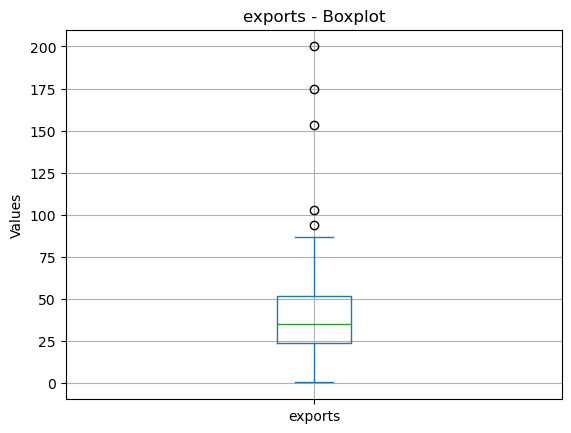

In [13]:
outlier_visualizer('exports')

In [14]:
outlier_finder('exports')

exports - % of outliers: 2.99%


,exports
country,
Ireland,103.0
Luxembourg,175.0
Malta,153.0
Seychelles,93.8
Singapore,200.0


exports outliers, after cross checking the export rate of those countries (as % of the GDP per capita) on the Internet, seem to be correct observations.

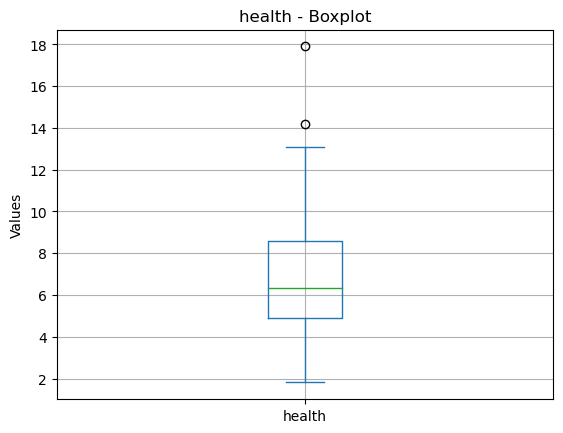

In [15]:
outlier_visualizer('health')

In [16]:
outlier_finder('health')

health - % of outliers: 1.2%


,health
country,
"Micronesia, Fed. Sts.",14.2
United States,17.9


The outliers in health indicators appear to be valid observations upon verifying the export rates of those countries as a percentage of the GDP per capita online.


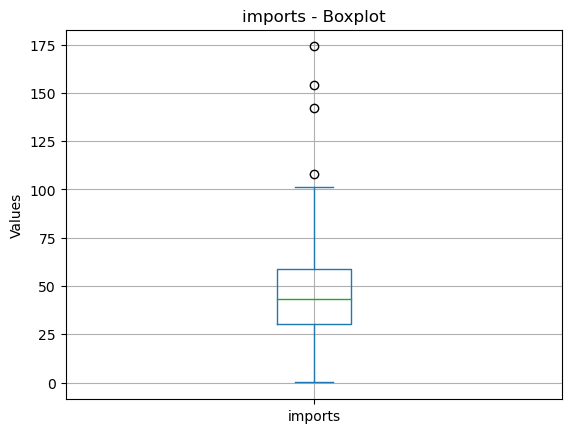

In [17]:
outlier_visualizer('imports')

In [18]:
outlier_finder('imports')

imports - % of outliers: 2.4%


,imports
country,
Luxembourg,142.0
Malta,154.0
Seychelles,108.0
Singapore,174.0


The outliers in import data appear to be accurate observations following confirmation of the export rates of those countries as a percentage of the GDP per capita through online cross-checking.


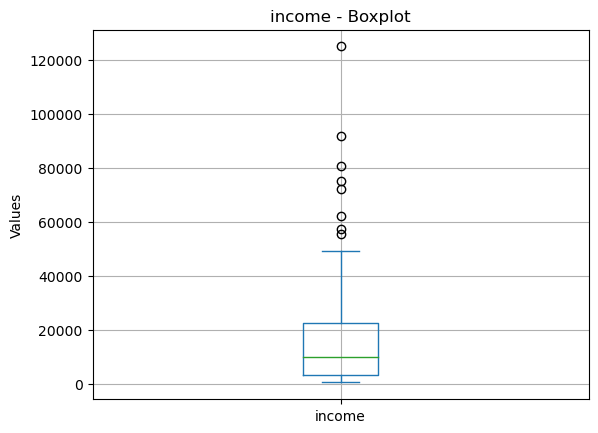

In [19]:
outlier_visualizer('income')

In [20]:
outlier_finder('income')

income - % of outliers: 4.79%


,income
country,
Brunei,80600
Kuwait,75200
Luxembourg,91700
Norway,62300
Qatar,125000
Singapore,72100
Switzerland,55500
United Arab Emirates,57600



It appears that the 8 income outliers are indeed valid observations, especially given that all of these countries are classified as very high-income nations.

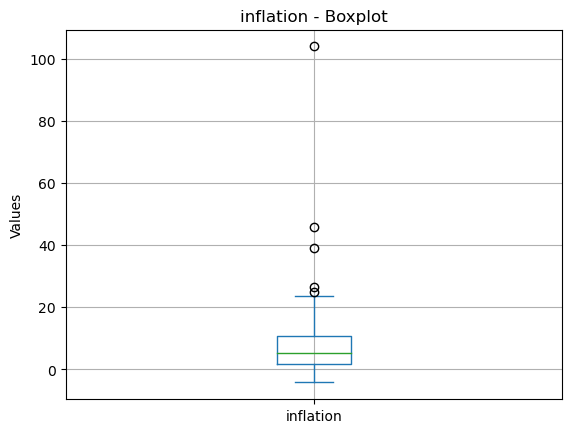

In [21]:
outlier_visualizer('inflation')

In [22]:
outlier_finder('inflation')

inflation - % of outliers: 2.99%


,inflation
country,
Equatorial Guinea,24.9
Mongolia,39.2
Nigeria,104.0
Timor-Leste,26.5
Venezuela,45.9


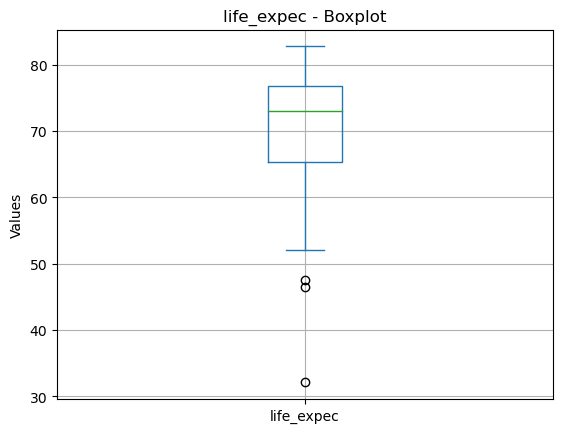

In [23]:
outlier_visualizer('life_expec')

In [24]:
outlier_finder('life_expec')

life_expec - % of outliers: 1.8%


,life_expec
country,
Central African Republic,47.5
Haiti,32.1
Lesotho,46.5


life_expec outliers seem to be correct observations.

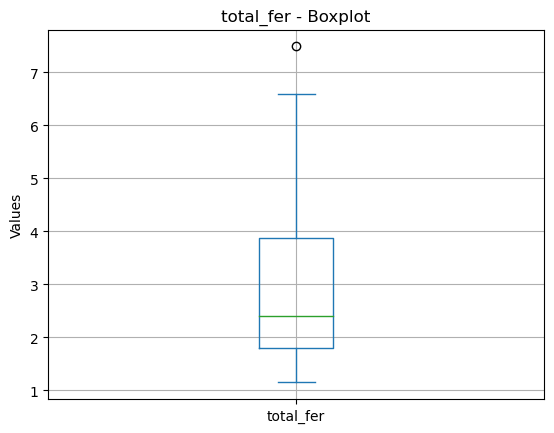

In [25]:
outlier_visualizer('total_fer')

In [26]:
outlier_finder('total_fer')

total_fer - % of outliers: 0.6%


,total_fer
country,
Niger,7.49


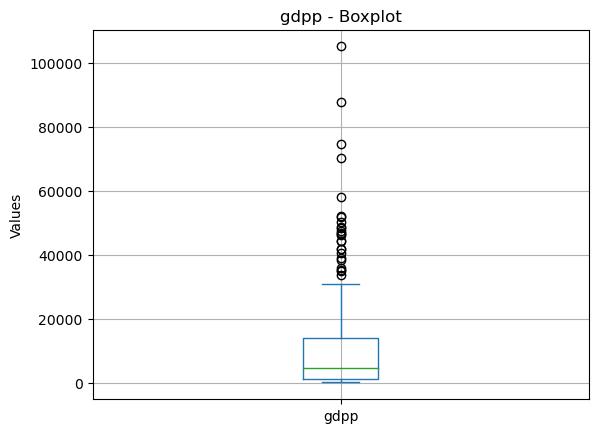

In [27]:
outlier_visualizer('gdpp')

In [28]:
outlier_finder('gdpp')

gdpp - % of outliers: 14.97%


,gdpp
country,
Australia,51900
Austria,46900
Belgium,44400
Brunei,35300
Canada,47400
Denmark,58000
Finland,46200
France,40600
Germany,41800


In [29]:
print('Numbers of gdpp outliers: ',len(outlier_finder('gdpp')))

gdpp - % of outliers: 14.97%
Numbers of gdpp outliers:  25


All 25 outliers in GDP per capita represent first-world countries, leading us to conclude that these observations are likely accurate.

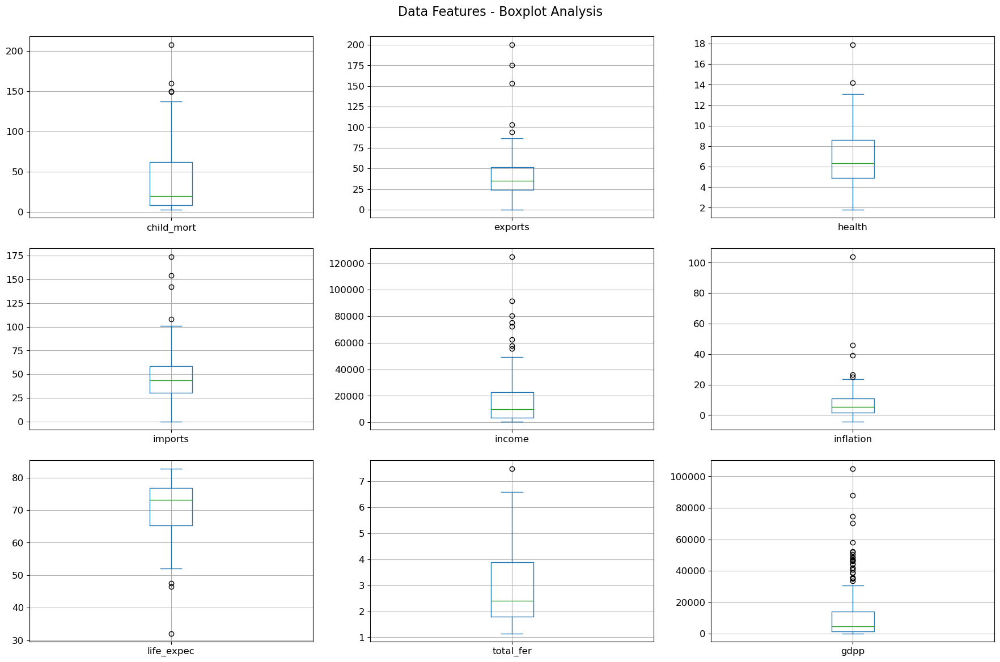

In [30]:
fig = plt.figure(figsize=(18,12))
child_mort = fig.add_subplot(3,3,1)
exports = fig.add_subplot(3,3,2)
health = fig.add_subplot(3,3,3)
imports = fig.add_subplot(3,3,4)
income = fig.add_subplot(3,3,5)
inflation = fig.add_subplot(3,3,6)
life_expec = fig.add_subplot(3,3,7)
total_fer = fig.add_subplot(3,3,8)
gdpp = fig.add_subplot(3,3,9)

country_ds['child_mort'].plot(kind='box', fontsize=12, ax=child_mort)
child_mort.grid(True)
country_ds['exports'].plot(kind='box', fontsize=12,ax=exports)
exports.grid(True)
country_ds['health'].plot(kind='box', fontsize=12,ax=health)
health.grid(True)
country_ds['imports'].plot(kind='box', fontsize=12,ax=imports)
imports.grid(True)
country_ds['income'].plot(kind='box', fontsize=12,ax=income)
income.grid(True)
country_ds['inflation'].plot(kind='box', fontsize=12,ax=inflation)
inflation.grid(True)
country_ds['life_expec'].plot(kind='box', fontsize=12,ax=life_expec)
life_expec.grid(True)
country_ds['total_fer'].plot(kind='box', fontsize=12,ax=total_fer)
total_fer.grid(True)
country_ds['gdpp'].plot(kind='box', fontsize=12,ax=gdpp)
gdpp.grid(True)

fig.suptitle('Data Features - Boxplot Analysis', fontsize=16)
plt.tight_layout(pad=2)
plt.show()

# EDA

In [31]:
country_ds.describe(include='all')

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
count,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000
mean,38.270060,41.108976,6.815689,46.890215,17144.688623,7.781832,70.555689,2.947964,12964.155689
std,40.328931,27.412010,2.746837,24.209589,19278.067698,10.570704,8.893172,1.513848,18328.704809
min,2.600000,0.109000,1.810000,0.065900,609.000000,-4.210000,32.100000,1.150000,231.000000
25%,8.250000,23.800000,4.920000,30.200000,3355.000000,1.810000,65.300000,1.795000,1330.000000
50%,19.300000,35.000000,6.320000,43.300000,9960.000000,5.390000,73.100000,2.410000,4660.000000
75%,62.100000,51.350000,8.600000,58.750000,22800.000000,10.750000,76.800000,3.880000,14050.000000
max,208.000000,200.000000,17.900000,174.000000,125000.000000,104.000000,82.800000,7.490000,105000.000000


To ensure uniformity across variables and prevent domination by features with larger scales in clustering algorithms, I'll normalize the data before modeling. This involves scaling all variables to the same range.


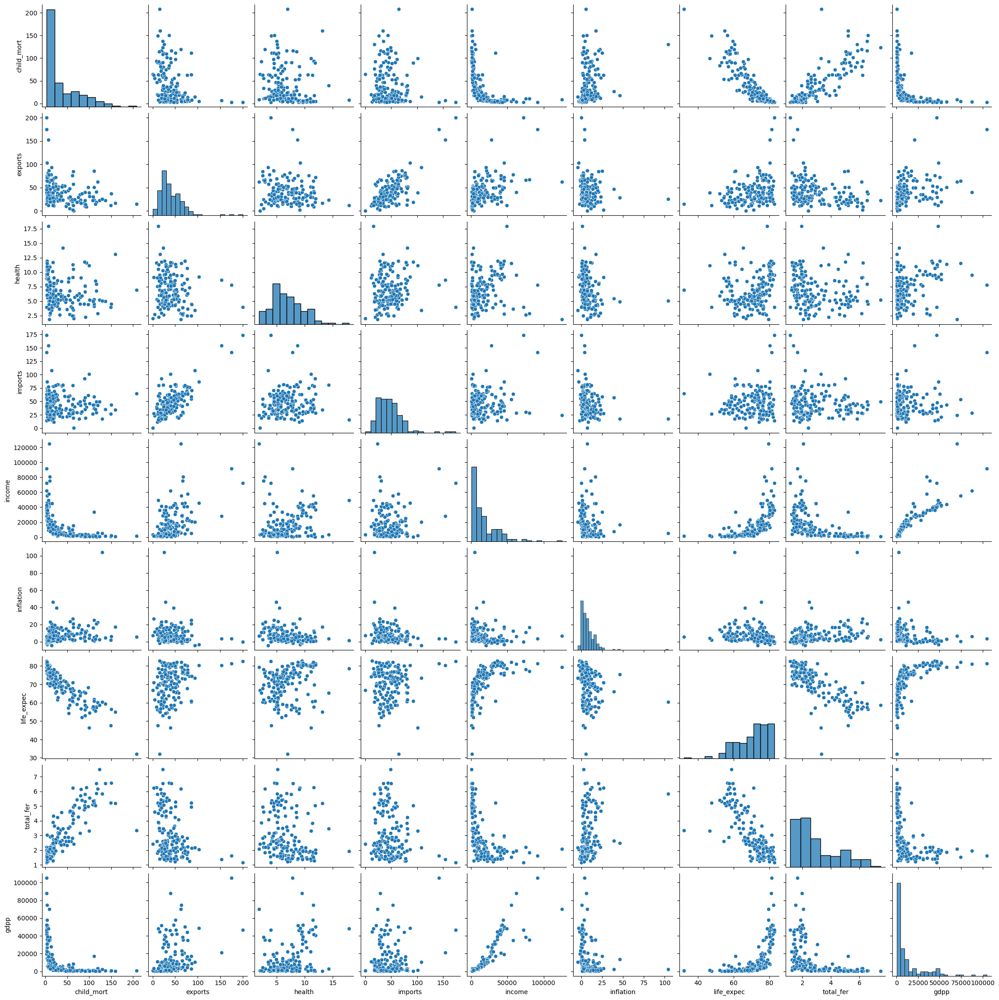

In [32]:
# See distribution and feature correlation
sns.pairplot(country_ds)
plt.show()

right-skewed:

* child_mort

* exports

* imports

* income

* inflation

* total_fer

* gdpp

left-skewed:

* life_expec

The remaining features seem to have a more or less normal distribution:

* health

In [33]:
#check variable skewness
country_ds.skew()

child_mort    1.450774
exports       2.445824
health        0.705746
imports       1.905276
income        2.231480
inflation     5.154049
life_expec   -0.970996
total_fer     0.967092
gdpp          2.218051
dtype: float64

In [34]:
def norm_check(data):
    for var in range(len(data.skew())):
        if abs(data.skew()[var]) > 0.75:
            print('"{}" skew: {}. The variable is NOT normally distributed.'.format(data.skew().index[var],
                                                                                    round(data.skew()[var],2)))
        else:
            print('"{}" skew: {}. The Variable is normally distributed'.format(data.skew().index[var],
                                                                                round(data.skew()[var],2)))
            
norm_check(country_ds)

"child_mort" skew: 1.45. The variable is NOT normally distributed.
"exports" skew: 2.45. The variable is NOT normally distributed.
"health" skew: 0.71. The Variable is normally distributed
"imports" skew: 1.91. The variable is NOT normally distributed.
"income" skew: 2.23. The variable is NOT normally distributed.
"inflation" skew: 5.15. The variable is NOT normally distributed.
"life_expec" skew: -0.97. The variable is NOT normally distributed.
"total_fer" skew: 0.97. The variable is NOT normally distributed.
"gdpp" skew: 2.22. The variable is NOT normally distributed.


Linear correlation between features:

child_mort and life_expec

total_fer and child_mort

exports and imports

income and gdpp

life_expec and total_fer

In [35]:
country_ds.corr()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
child_mort,1.000000,-0.318093,-0.200402,-0.127211,-0.524315,0.288276,-0.886676,0.848478,-0.483032
exports,-0.318093,1.000000,-0.114408,0.737381,0.516784,-0.107294,0.316313,-0.320011,0.418725
health,-0.200402,-0.114408,1.000000,0.095717,0.129579,-0.255376,0.210692,-0.196674,0.345966
imports,-0.127211,0.737381,0.095717,1.000000,0.122406,-0.246994,0.054391,-0.159048,0.115498
income,-0.524315,0.516784,0.129579,0.122406,1.000000,-0.147756,0.611962,-0.501840,0.895571
inflation,0.288276,-0.107294,-0.255376,-0.246994,-0.147756,1.000000,-0.239705,0.316921,-0.221631
life_expec,-0.886676,0.316313,0.210692,0.054391,0.611962,-0.239705,1.000000,-0.760875,0.600089
total_fer,0.848478,-0.320011,-0.196674,-0.159048,-0.501840,0.316921,-0.760875,1.000000,-0.454910
gdpp,-0.483032,0.418725,0.345966,0.115498,0.895571,-0.221631,0.600089,-0.454910,1.000000


In [36]:
# creating a function to check which feature are lineraly correlated and what is the correlation coefficient
def corr_matrix(data):
    corr_matrix = data.corr()
    
    for var in corr_matrix.columns:
        corr_matrix[var] = corr_matrix[var].apply(lambda x:x if abs(x) > 0.70 and abs(x) < 1 else '')
    
    return corr_matrix

In [37]:
corr_matrix(country_ds)

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
child_mort,,,,,,,-0.886676,0.848478,
exports,,,,0.737381,,,,,
health,,,,,,,,,
imports,,0.737381,,,,,,,
income,,,,,,,,,0.895571
inflation,,,,,,,,,
life_expec,-0.886676,,,,,,,-0.760875,
total_fer,0.848478,,,,,,-0.760875,,
gdpp,,,,,0.895571,,,,


The only normally distributed variable is: health. The correlation matrix confirmed the results from the pairplots inspection.

# Feature Engineering and Variable Transformations 

In [38]:
# Create a function to apply several transformations
def transformer(data,function):
    lam = []
    for col in data.columns:
        if abs(data[col].skew()) > 0.75:
            if function == boxcox:
                data[col], lam_val = function(data[col] + abs(country_ds.min().min())+0.001)
                lam.append(lam_val)
            else:
                data[col] = function(data[col] + abs(country_ds.min().min())+0.001)
                # inflation is the only feature with negative values; to make the log transform possible,
                ## I added the lowest value of inflation +0.001 to make all values positive
    if function == boxcox:
        return data, lam
    else:
        return data

In [39]:
log_data = country_ds.copy(deep=True) 
log_data = transformer(log_data, np.log)
log_data.skew()

child_mort    0.241073
exports      -0.358373
health        0.705746
imports      -0.646111
income       -0.234644
inflation    -5.283491
life_expec   -1.579032
total_fer     0.725025
gdpp          0.009090
dtype: float64

In [40]:
norm_check(log_data)

"child_mort" skew: 0.24. The Variable is normally distributed
"exports" skew: -0.36. The Variable is normally distributed
"health" skew: 0.71. The Variable is normally distributed
"imports" skew: -0.65. The Variable is normally distributed
"income" skew: -0.23. The Variable is normally distributed
"inflation" skew: -5.28. The variable is NOT normally distributed.
"life_expec" skew: -1.58. The variable is NOT normally distributed.
"total_fer" skew: 0.73. The Variable is normally distributed
"gdpp" skew: 0.01. The Variable is normally distributed


Pairplot - Data Log Transformed


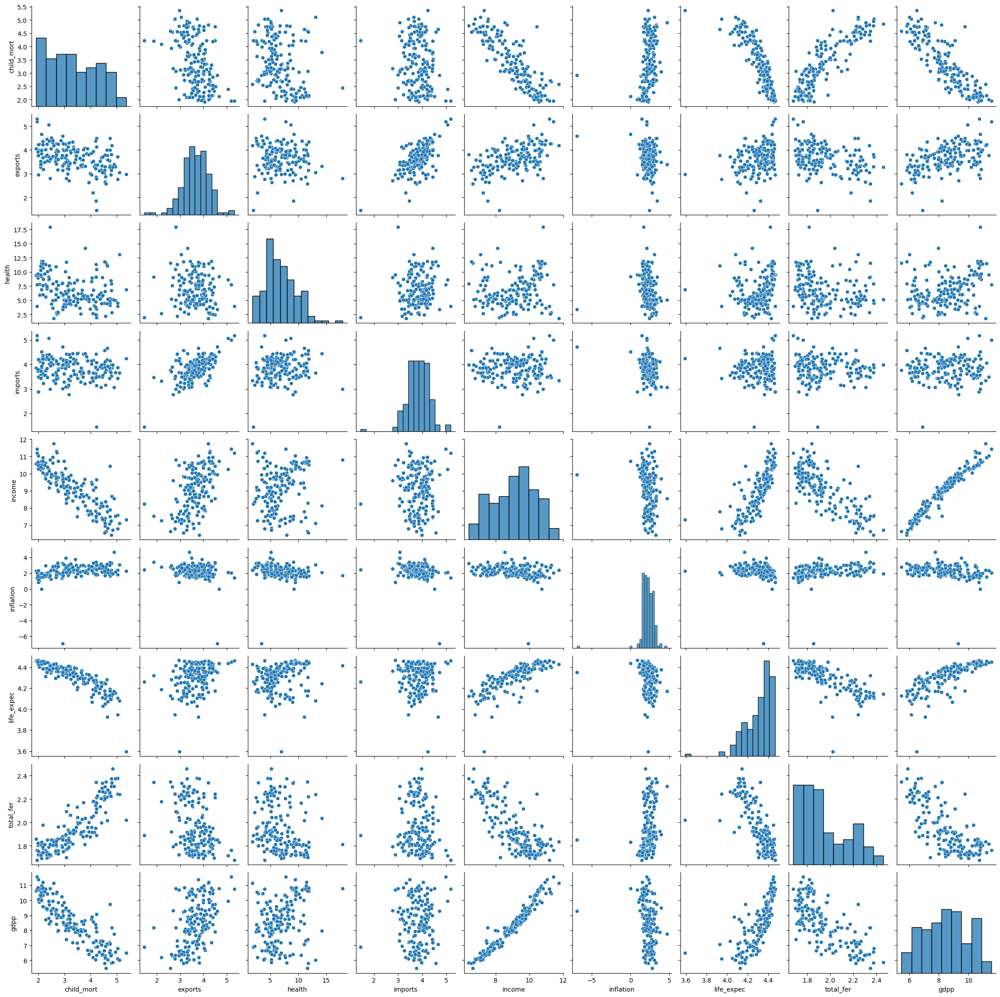

In [41]:
print('Pairplot - Data Log Transformed')
sns.pairplot(log_data)
plt.show()

In [42]:
print('Correlation Matrix - Data Log Transformed')
corr_matrix(log_data)

Correlation Matrix - Data Log Transformed


,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
child_mort,,,,,-0.859524,,-0.863493,0.869741,-0.868332
exports,,,,,,,,,
health,,,,,,,,,
imports,,,,,,,,,
income,-0.859524,,,,,,0.773093,-0.776331,0.971986
inflation,,,,,,,,,
life_expec,-0.863493,,,,0.773093,,,-0.736778,0.759246
total_fer,0.869741,,,,-0.776331,,-0.736778,,-0.735979
gdpp,-0.868332,,,,0.971986,,0.759246,-0.735979,


The Logarithmic Transformation has proven highly effective: most variables are now normally distributed (except for inflation and life expectancy), revealing new linear relationships between several variables:

Child mortality exhibits a linear correlation with income (new), life expectancy, total fertility rate, and GDP per capita (new).

Income demonstrates a linear correlation with child mortality (new), life expectancy (new), total fertility rate (new), and GDP per capita (almost a perfect positive correlation).

Life expectancy shows a linear correlation with child mortality, income (new), total fertility rate, and GDP per capita (new).

Total fertility rate displays a linear correlation with child mortality, income (new), life expectancy, and GDP per capita (new).

GDP per capita correlates linearly with child mortality (new), income (almost perfectly), life expectancy (new), and total fertility rate (new).

On the downside, we've lost the linear relationship between exports and imports.

In [43]:
#Square Root Transformation
sqrt_data = country_ds.copy() 
sqrt_data = transformer(sqrt_data, np.sqrt)
sqrt_data.skew()

child_mort    0.812560
exports       0.966607
health        0.705746
imports       0.725291
income        0.857148
inflation     1.779440
life_expec   -1.232322
total_fer     0.844463
gdpp          1.143604
dtype: float64

In [44]:
norm_check(sqrt_data)

"child_mort" skew: 0.81. The variable is NOT normally distributed.
"exports" skew: 0.97. The variable is NOT normally distributed.
"health" skew: 0.71. The Variable is normally distributed
"imports" skew: 0.73. The Variable is normally distributed
"income" skew: 0.86. The variable is NOT normally distributed.
"inflation" skew: 1.78. The variable is NOT normally distributed.
"life_expec" skew: -1.23. The variable is NOT normally distributed.
"total_fer" skew: 0.84. The variable is NOT normally distributed.
"gdpp" skew: 1.14. The variable is NOT normally distributed.


Pairplot - Data after Square Root Transformation


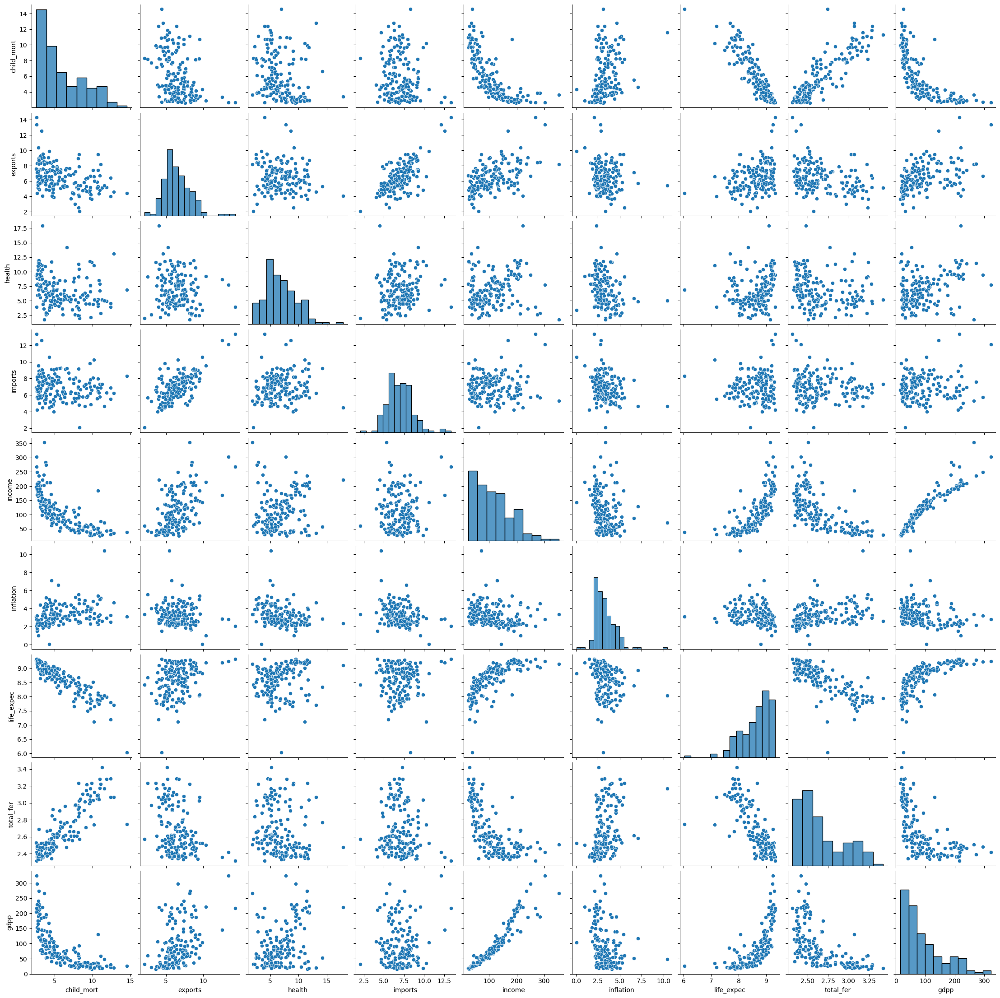

In [45]:
print('Pairplot - Data after Square Root Transformation')
sns.pairplot(sqrt_data)
plt.show()

In [46]:
print('Correlation Matrix - After Square Root Transformation')
corr_matrix(sqrt_data)

Correlation Matrix - After Square Root Transformation


,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
child_mort,,,,,-0.744578,,-0.899472,0.877578,-0.712024
exports,,,,,,,,,
health,,,,,,,,,
imports,,,,,,,,,
income,-0.744578,,,,,,0.718478,,0.947983
inflation,,,,,,,,,
life_expec,-0.899472,,,,0.718478,,,-0.752539,
total_fer,0.877578,,,,,,-0.752539,,
gdpp,-0.712024,,,,0.947983,,,,


The Square Root Transformation yielded some notable outcomes:

The Imports variable is now normally distributed.

It reinforced certain linear correlations between variables (though, like the logarithmic transformation, it resulted in the 

loss of the linear relationship between exports and imports).

However, the logarithmic transformation proved more successful in normalizing the data distribution and enhancing the linear correlations between features.

In [47]:
# BoxCox Transformation
bc_data = country_ds.copy() 
bc_data, lambda_list = transformer(bc_data, boxcox) #storing the lambda values of boxcox transform in a separate list
bc_data.skew()

child_mort    0.062932
exports       0.030569
health        0.705746
imports       0.069233
income       -0.035717
inflation     0.418363
life_expec   -0.182170
total_fer     0.199942
gdpp          0.001558
dtype: float64

In [48]:
norm_check(bc_data)

"child_mort" skew: 0.06. The Variable is normally distributed
"exports" skew: 0.03. The Variable is normally distributed
"health" skew: 0.71. The Variable is normally distributed
"imports" skew: 0.07. The Variable is normally distributed
"income" skew: -0.04. The Variable is normally distributed
"inflation" skew: 0.42. The Variable is normally distributed
"life_expec" skew: -0.18. The Variable is normally distributed
"total_fer" skew: 0.2. The Variable is normally distributed
"gdpp" skew: 0.0. The Variable is normally distributed


Pairplot - Data BoxCox Transformed


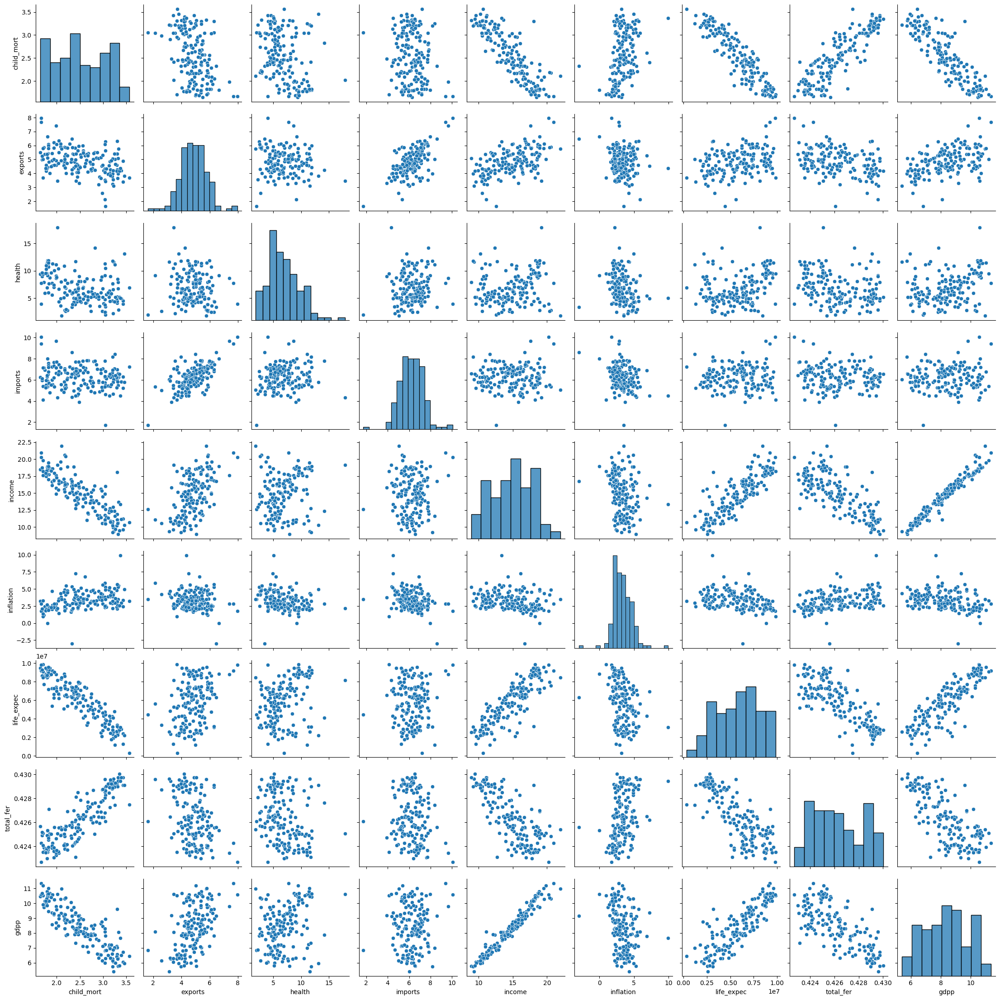

In [49]:
print('Pairplot - Data BoxCox Transformed')
sns.pairplot(bc_data)
plt.show()

In [50]:
print('Correlation Matrix - Data BoxCox Transformed')
corr_matrix(bc_data)

Correlation Matrix - Data BoxCox Transformed


,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
child_mort,,,,,-0.858853,,-0.913547,0.87042,-0.875005
exports,,,,,,,,,
health,,,,,,,,,
imports,,,,,,,,,
income,-0.858853,,,,,,0.838438,-0.750676,0.974396
inflation,,,,,,,,,
life_expec,-0.913547,,,,0.838438,,,-0.786441,0.849259
total_fer,0.87042,,,,-0.750676,,-0.786441,,-0.733234
gdpp,-0.875005,,,,0.974396,,0.849259,-0.733234,


In [51]:
comp_matrix = pd.concat([corr_matrix(bc_data), corr_matrix(log_data).rename(columns=\
                                                                            {old:str('log-'+old)\
                                                                             for old in corr_matrix(log_data).columns})],\
                        axis=1)

comp_matrix = pd.concat([comp_matrix, corr_matrix(sqrt_data).rename(columns={old:str('sqrt-'+old)\
                                                                             for old in corr_matrix(sqrt_data).columns})],\
                        axis=1)

for c in comp_matrix.columns:
    comp_matrix[c] = comp_matrix[c].apply(lambda x:0 if x == '' else x)

for bc,log,sqrt in zip(comp_matrix.columns[:9],comp_matrix.columns[9:-9],comp_matrix.columns[-9:]):
    comp_matrix[bc] = comp_matrix[[bc,log,sqrt]].apply(lambda x: 'boxcox' if abs(x[0]) > abs(x[1]) and abs(x[0]) > abs(x[2])\
                                                       else 'log' if abs(x[0]) < abs(x[1]) and abs(x[0]) > abs(x[2])\
                                                       else 'sqrt' if abs(x[0]) > abs(x[1]) and abs(x[0]) < abs(x[2])\
                                                       else 'log' if abs(x[1]) > abs(x[0]) and abs(x[1]) > abs(x[2])\
                                                       else 'sqrt' if abs(x[1]) > abs(x[0]) and abs(x[1]) < abs(x[2])\
                                                       else 'boxcox' if abs(x[1]) < abs(x[0]) and abs(x[1]) > abs(x[2])\
                                                       else 'sqrt' if abs(x[2]) > abs(x[0]) and abs(x[2]) > abs(x[1])\
                                                       else 'log' if abs(x[2]) > abs(x[0]) and abs(x[2]) < abs(x[1])\
                                                       else 'boxcox' if abs(x[2]) < abs(x[0]) and abs(x[2]) > abs(x[1])\
                                                       else 'log' if abs(x[0]) < abs(x[1]) and abs(x[0]) < abs(x[2]) and abs(x[1]) > abs(x[2])\
                                                       else 'sqrt' if abs(x[0]) < abs(x[1]) and abs(x[0]) < abs(x[2]) and abs(x[1]) < abs(x[2])\
                                                       else 'boxcox' if abs(x[1]) < abs(x[0]) and abs(x[1]) < abs(x[2]) and abs(x[0]) > abs(x[2])\
                                                       else 'sqrt' if abs(x[1]) < abs(x[0]) and abs(x[1]) < abs(x[2]) and abs(x[0]) < abs(x[2])\
                                                       else 'boxcox' if abs(x[2]) < abs(x[0]) and abs(x[2]) < abs(x[1]) and abs(x[0]) > abs(x[1])\
                                                       else 'log' if abs(x[2]) < abs(x[0]) and abs(x[2]) < abs(x[1]) and abs(x[0]) < abs(x[1])\
                                                       else '', axis=1)
    
comp_matrix.drop(comp_matrix.columns[-18:], axis=1, inplace=True)
print('Correlation Cefficient Comparison Matrix:')
comp_matrix

Correlation Cefficient Comparison Matrix:


,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
child_mort,,,,,log,,boxcox,sqrt,boxcox
exports,,,,,,,,,
health,,,,,,,,,
imports,,,,,,,,,
income,log,,,,,,boxcox,log,boxcox
inflation,,,,,,,,,
life_expec,boxcox,,,,boxcox,,,boxcox,boxcox
total_fer,sqrt,,,,log,,boxcox,,log
gdpp,boxcox,,,,boxcox,,boxcox,log,


In [52]:
for c in comp_matrix.columns:
    comp_matrix[c] = comp_matrix[c].apply(lambda x:np.nan if x == '' else x)
    
boxcox=[]
log=[]
sqrt=[]

for col in comp_matrix.columns:
    try:
        boxcox.append(comp_matrix[col].value_counts().loc['boxcox'])
    except:
        boxcox.append(0)
    try:
        log.append(comp_matrix[col].value_counts().loc['log'])
    except:
        log.append(0)
    try:
        sqrt.append(comp_matrix[col].value_counts().loc['sqrt'])
    except:
        log.append(0)
print('Boxcox Transformation highest correlation coefficients:', int(sum(boxcox)/2))
print('Log Transformation highest correlation coefficient:', int(sum(log)/2))
print('Square Root Transformation highest correlation coefficient:', int(sum(sqrt)/2))

Boxcox Transformation highest correlation coefficients: 6
Log Transformation highest correlation coefficient: 3
Square Root Transformation highest correlation coefficient: 1


The Box-Cox Transformation has emerged as the most effective type of transformation:

All features transformed using Box-Cox are normally distributed.
Box-Cox transformation significantly enhances linear correlations between features. Out of 10 linear correlation coefficients greater than 0.7, 6 are obtained through Box-Cox transformation, 3 through logarithmic transformation, and 1 with square root transformation.
I'll apply the Box-Cox transformation to the dataset to bring the data distribution closer to the known Gaussian distribution and strengthen the linear correlations between the features.

In [53]:
bc_data

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
country,,,,,,,,,
Afghanistan,3.208692,3.225288,7.58,6.341887,10.816138,3.902316,2.364496e+06,0.429421,6.259053
Albania,2.392947,4.491850,6.55,6.523385,14.899243,3.004359,7.271094e+06,0.424320,8.207013
Algeria,2.637163,4.959927,4.17,5.574597,15.548800,4.797498,7.341992e+06,0.426892,8.291234
Angola,3.332581,5.744331,2.85,6.239373,13.655328,5.467484,3.019944e+06,0.429574,8.063779
Antigua and Barbuda,2.166808,5.225818,6.03,6.981822,16.554715,2.246702,7.449303e+06,0.425514,9.268509
...,...,...,...,...,...,...,...,...,...
Vanuatu,2.670315,5.264054,5.25,6.713447,12.094788,2.568010,3.588520e+06,0.427690,7.895698
Venezuela,2.407374,4.517135,4.91,4.509590,16.175147,7.257570,6.958337e+06,0.426195,9.366695
Vietnam,2.559065,5.994266,6.84,7.772154,13.027748,4.290725,6.204557e+06,0.425102,7.098660


In [54]:
# display the values of boxcox lambdas
cols = []
for i in range(len(country_ds.skew().index)):
    if abs(country_ds.skew()[i]) > 0.75:
        cols.append(country_ds.skew().index[i])

lambda_values = pd.Series(dict(zip(cols, lambda_list)))
print('Lambda values used in BoxCox transformation per data feature:')
lambda_values

Lambda values used in BoxCox transformation per data feature:


child_mort   -0.163454
exports       0.142427
imports       0.232995
income        0.097441
inflation     0.288592
life_expec    3.911049
total_fer    -2.317588
gdpp         -0.003218
dtype: float64

#Feature Scaling

In [55]:
bc_data.describe()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
count,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,1.670000e+02,167.000000,167.000000
mean,2.524776,4.844862,6.815689,6.251297,14.862238,3.291616,5.851170e+06,0.426303,8.383146
std,0.534895,0.939880,2.746837,1.111198,2.964398,1.373132,2.293186e+06,0.001998,1.457027
min,1.646846,1.626900,1.810000,1.729543,8.919018,-2.993101,3.229179e+05,0.422675,5.412789
25%,2.066908,4.265022,4.920000,5.496081,12.376412,2.352180,4.093249e+06,0.424714,7.113308
50%,2.466485,4.818866,6.320000,6.260139,14.906637,3.190764,6.204557e+06,0.426083,8.333888
75%,3.035741,5.421425,8.600000,6.975567,17.021320,4.099667,7.449303e+06,0.428090,9.404664
max,3.569427,7.955873,17.900000,10.066584,21.941208,9.925201,9.850906e+06,0.430040,11.349325


features are still on different scales (in particular life_expec and total_fer)

In [56]:
from sklearn.preprocessing import StandardScaler

In [57]:
#Z-Score Normalization
scaled_ds = StandardScaler().fit_transform(bc_data)
scaled_ds

array([[ 1.28244392, -1.72835389,  0.27908825, ..., -1.52502273,
         1.56492702, -1.46221155],
       [-0.24719848, -0.37672276, -0.09701618, ...,  0.6210549 ,
        -0.99574749, -0.12124938],
       [ 0.21074305,  0.12279285, -0.96607302, ...,  0.65206496,
         0.29520074, -0.06327161],
       ...,
       [ 0.0642978 ,  1.22660376,  0.0088773 , ...,  0.15456667,
        -0.6029282 , -0.88423218],
       [ 0.87101873, -0.27085693, -0.59727159, ..., -0.53686047,
         1.22748971, -0.88423218],
       [ 1.21228386,  0.06210147, -0.33801514, ..., -1.77901604,
         1.45707964, -0.81154276]])

# Model Building

In [58]:
# importing the libraries
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from scipy.cluster import hierarchy
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA

# 1. K-means

Let's employ the K-Means algorithm, fitting the model with a varying number of clusters ranging from 2 to 10. We'll utilize the k-means++ initialization method for smarter initialization.

For each value of K, we'll record both the Inertia and Distortion metrics. Inertia represents the sum of intracluster distances, where an intracluster distance is the sum of squared distances from each point to its cluster centroid. Distortion, on the other hand, represents the average of the mean squared distance from each point to the centroid of its respective cluster. To calculate Distortion, I'll create a function named distortion_function().

After obtaining the Inertia and Distortion values for each K-value, we'll plot the number of clusters against the error. We'll apply the elbow rule to determine the optimal number of clusters based on this plot.






In [59]:
def distortion_function(k, dataset, init='k-means++', random_state=98):
    km = KMeans(init='k-means++', n_clusters=k, random_state=98)
    km.fit(dataset)
    dist_matrix = pd.DataFrame(columns=['Cluster', 'Distance'])
    for x in range(len(dataset)):
        dist_matrix = dist_matrix.append({'Cluster':km.labels_[x],
                                          'Distance':((dataset[x] - km.cluster_centers_[km.labels_[x]])**2).sum()},
                                         ignore_index=True)
    distortion = (dist_matrix.groupby(['Cluster']).mean()).mean()[0]
    #distortion = dist_matrix.groupby(['Cluster']).sum().mean()[0]
    return distortion

inertia = []
distortion = []
silhouette = []

for k in range(2,11):
    km = KMeans(init='k-means++', n_clusters=k, random_state=98)
    km.fit(scaled_ds)
    inertia.append(km.inertia_)
    distortion.append(distortion_function(k=k, dataset=scaled_ds))
    silhouette.append(silhouette_score(scaled_ds, km.labels_))

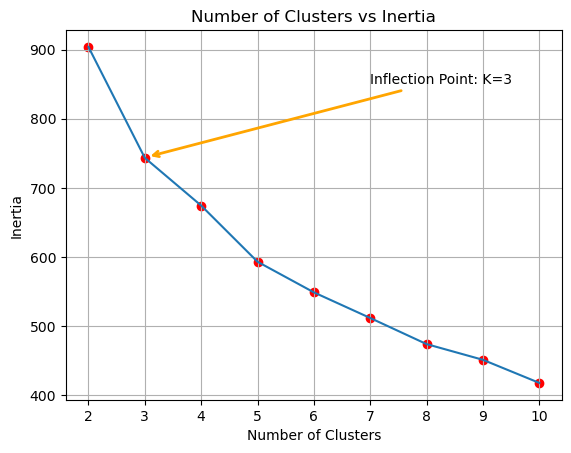

In [60]:
#plt.figure(figsize=(8,5.5))
plt.plot(range(2,11), inertia)
plt.scatter(range(2,11),inertia, color='red')
plt.title('Number of Clusters vs Inertia')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
#plt.xticks(ticks=range(2,11), labels=range(2,11))
plt.grid(True)
plt.annotate('Inflection Point: K=3',
             xy=(3.05,745),
             xytext=(7,850),
             arrowprops = dict(arrowstyle='->', connectionstyle='arc3', color='orange', lw=2))
#plt.annotate('',
 #            xy=(5.05,600),
  #           xytext=(9,790),
   #          arrowprops = dict(arrowstyle='->', connectionstyle='arc3', color='orange', lw=2))
plt.show()

Not easy to locate an elbow point. Maybe a kind of an elbow when k=3.
Let's check the Distortion rate.

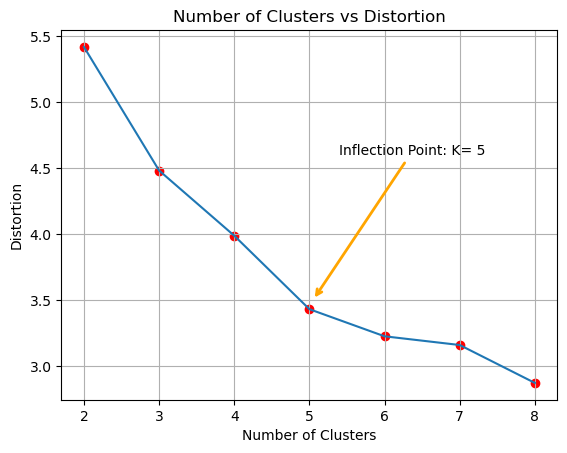

In [61]:
#plt.figure(figsize=(8,5.5))
plt.plot(range(2,9), distortion[:7])
plt.scatter(range(2,9),distortion[:7], color='red')
plt.annotate('Inflection Point: K= 5',
             xy=(5.05,3.5),
             xytext=(5.4,4.6),
             arrowprops = dict(arrowstyle='->', connectionstyle='arc3', color='orange', lw=2))
plt.title('Number of Clusters vs Distortion')
plt.xlabel('Number of Clusters')
plt.ylabel('Distortion')
#plt.xticks(ticks=range(2,11), labels=range(2,11))
plt.grid(True)
plt.show()

Once again, identifying the elbow point is challenging, but it seems likely that it occurs around k=5 (or k=4).

Utilizing the Inertia/Distortion analysis, I'll retrain the model with the number of clusters set to 3, 4, and 5. To compare the clusters and assess for significant differences or overlap, I'll employ boxplots as a comparison technique. This will help determine whether the clusters exhibit clear distinctions or if there's overlap among them, particularly regarding specific variables. Based on the boxplot analysis, I'll then select the optimal number of clusters that result in distinct, non-overlapping clusters.


In [62]:
def cluster_boxplots(scaled_dataset, original_dataset, k=2, plot_size=(14,11), add_info=''):
    km = KMeans(init='k-means++', n_clusters=k, random_state=98)
    km.fit(scaled_dataset)
    original_dataset['cluster'] = km.labels_
    
    fig = plt.figure(figsize=plot_size)
    child_mort = fig.add_subplot(3,3,1) # or fig.add_subplot(xyz)
    exports = fig.add_subplot(3,3,2)
    health = fig.add_subplot(3,3,3)
    imports = fig.add_subplot(3,3,4)
    income = fig.add_subplot(3,3,5)
    inflation = fig.add_subplot(3,3,6)
    life_expec = fig.add_subplot(3,3,7)
    total_fer = fig.add_subplot(3,3,8)
    gdpp = fig.add_subplot(3,3,9)

    #subplot 1
    sns.boxplot(x='cluster', y='child_mort', data=original_dataset, ax=child_mort)
    child_mort.set_xlabel('')
    
    #subplot 2
    sns.boxplot(x='cluster', y='exports', data=original_dataset, ax=exports)
    exports.set_xlabel('')

    #subplot 3
    sns.boxplot(x='cluster', y='health', data=original_dataset, ax=health)
    health.set_xlabel('')

    #subplot 4
    sns.boxplot(x='cluster', y='imports', data=original_dataset, ax=imports)
    imports.set_xlabel('')
    
    #subplot 5
    sns.boxplot(x='cluster', y='income', data=original_dataset, ax=income)
    income.set_xlabel('')
    
    #subplot 6
    sns.boxplot(x='cluster', y='inflation', data=original_dataset, ax=inflation)
    inflation.set_xlabel('')

    #subplot 7
    sns.boxplot(x='cluster', y='life_expec', data=original_dataset, ax=life_expec)
    life_expec.set_xlabel('')

    #subplot 8
    sns.boxplot(x='cluster', y='total_fer', data=original_dataset, ax=total_fer)
    total_fer.set_xlabel('')
    
    #subplot 9
    sns.boxplot(x='cluster', y='gdpp', data=original_dataset, ax=gdpp)
    gdpp.set_xlabel('')
    
    fig.suptitle('Clusters by Country Features - No of Cluster: {}{}'.format(k,add_info), fontsize=14)
    plt.tight_layout(pad=2)
    plt.show()

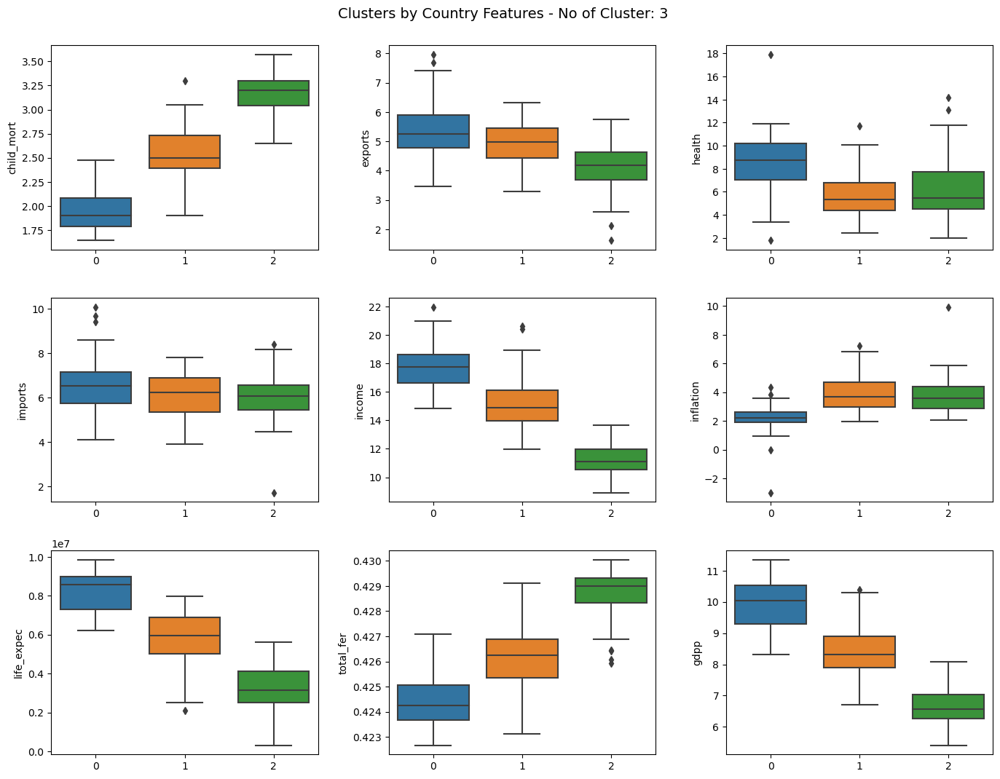

In [63]:
cluster_boxplots(scaled_ds, bc_data, k=3)

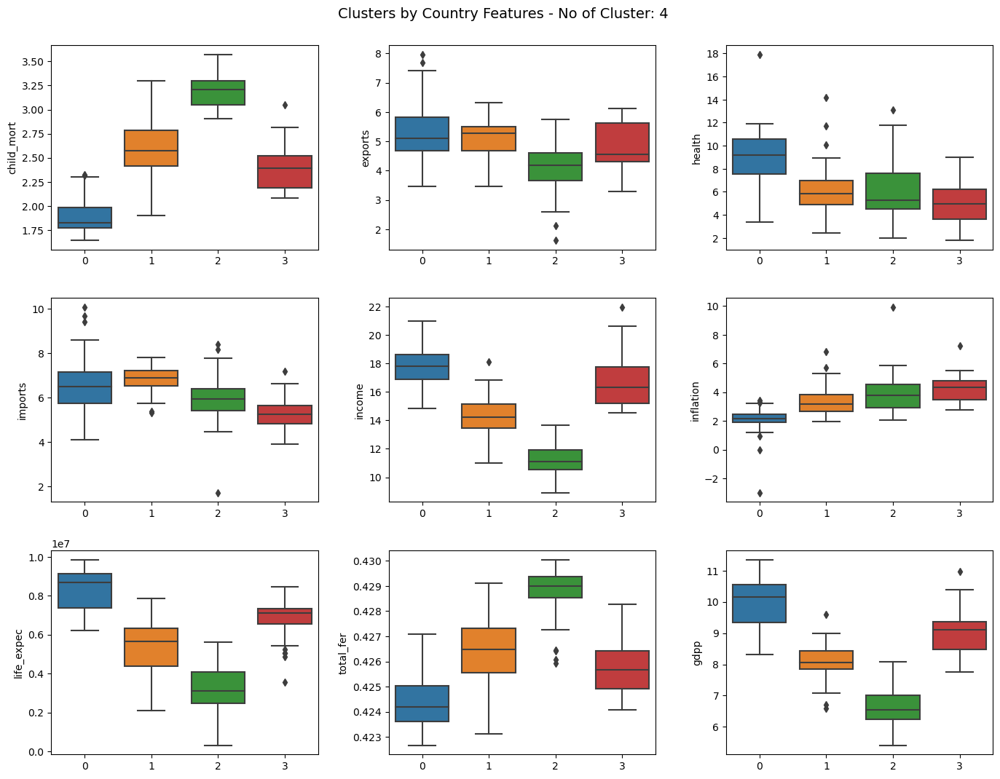

In [64]:
cluster_boxplots(scaled_ds, bc_data, k=4)

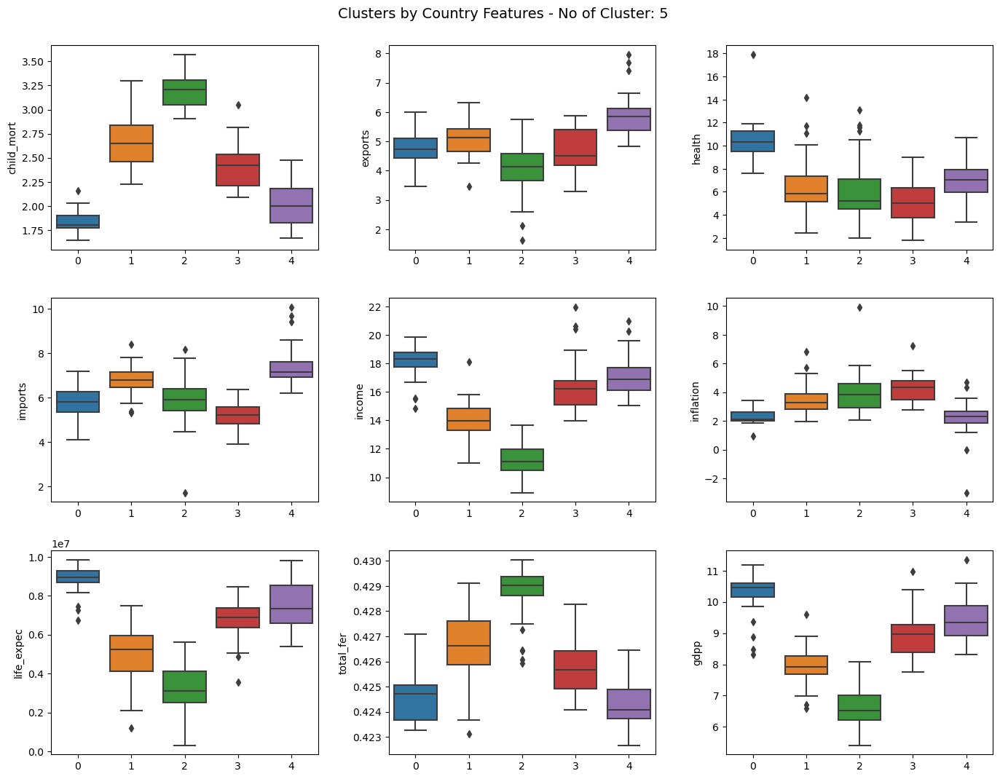

In [65]:
cluster_boxplots(scaled_ds, bc_data, k=5)

There's noticeable overlap between clusters in the following variables:

Imports
Health
Exports
Inflation
This indicates that these variables may not be particularly significant features for this clustering exercise.

When the number of clusters is set to 3, we observe relatively distinct clusters for all other features (the significant features):

Child mortality
Income
Life expectancy
Total fertility
GDP per capita
Increasing the number of clusters doesn't offer any additional insights into our data and only serves to increase overlap between clusters:

With 4 clusters, clusters 0 and 2 exhibit significant overlap.
With 5 clusters, clusters 0, 2, and 4 significantly overlap.





It can be concluded that focusing on 3 clusters provides the most meaningful and interpretable partitioning of the data, with distinct groupings observed for the most significant features.

Pairplot - Number of K-Means clusters (using all data features): 3


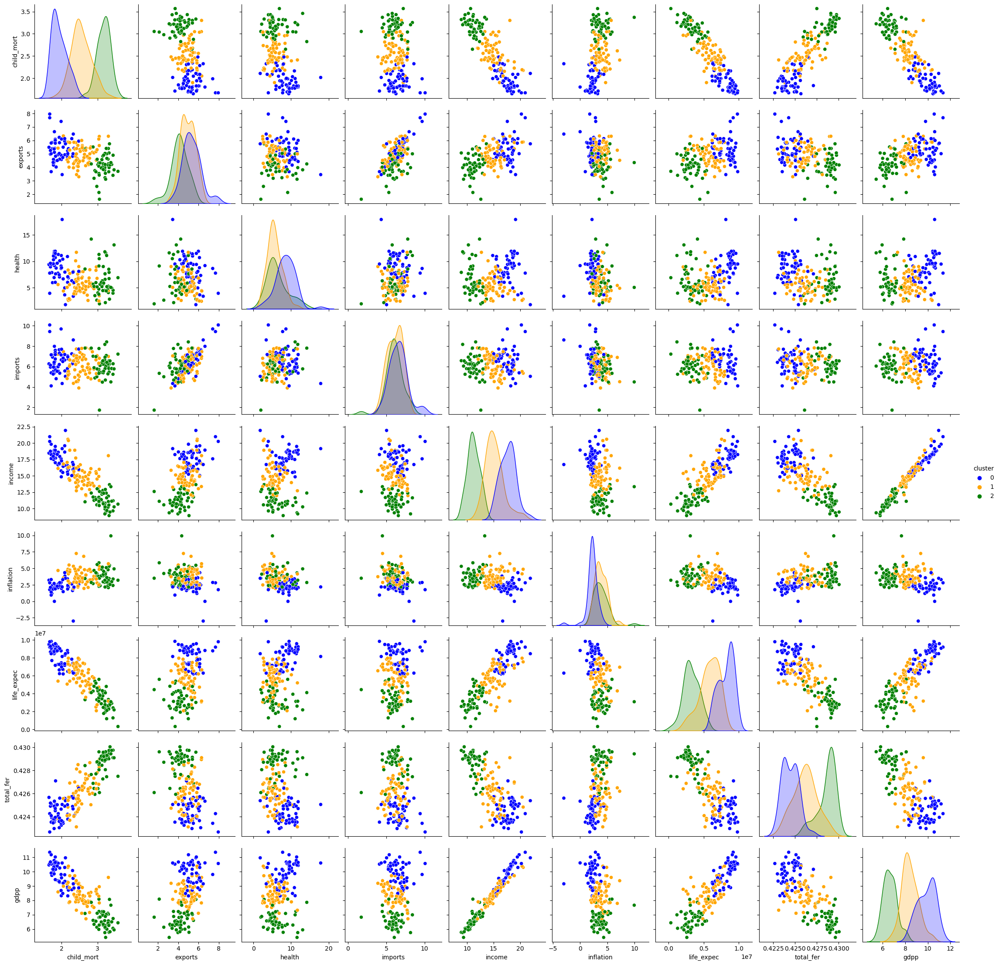

In [66]:
km = KMeans(init='k-means++', n_clusters=3, random_state=98)
km.fit(scaled_ds)
bc_data['cluster'] = km.labels_
print('Pairplot - Number of K-Means clusters (using all data features): 3')
sns.pairplot(bc_data, hue='cluster', palette={0:'blue', 1:'orange', 2:'green'})
plt.show()

### PCA 

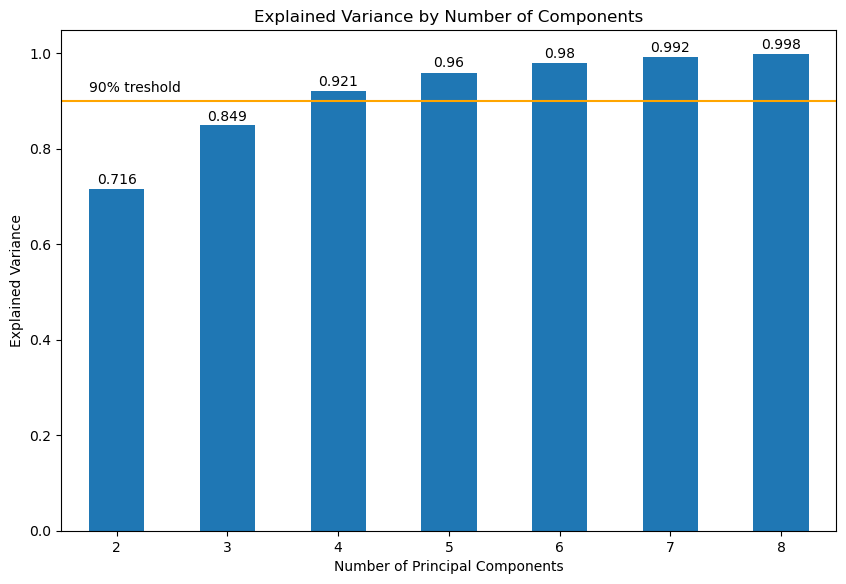

In [67]:
expl_var = {'N_components':[], 'Explained Variance':[]}

for p in range(2,9):
    pca = PCA(n_components=p)
    pca_data = pca.fit_transform(scaled_ds)
    expl_var['N_components'].append(p)
    expl_var['Explained Variance'].append(pca.explained_variance_ratio_.sum())
    

expl_var = pd.DataFrame(expl_var)
barchart = expl_var.plot(x='N_components', y='Explained Variance', kind='bar',figsize=(10,6.5), legend=False)
for i in barchart.patches:
    barchart.annotate(round(i.get_height(),3), # get the frequency of the variable categories
                      xy = (i.get_x() + i.get_width()/2, i.get_height()*1.005), # set the coordinates for each label
                      ha='center', # set the horizontal alignment
                      va='top', # set the vertical alignment
                      xytext=(0,10), # default
                      textcoords='offset points', # default
                      fontsize=10) # set the font size
plt.plot(range(-1,10), np.full((11,), 0.9), color='orange')
plt.text(-0.25, 0.92, '90% treshold')
plt.title('Explained Variance by Number of Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Explained Variance')
plt.xticks(rotation=0)
plt.grid(False)
plt.show()

If we reduce the dimensionality from 9 features to 4 components, we still can maintain more than 90% of the original variance. I choose 4 as number of new components, and retrain the k-means algorithm on the dimension-reduced dataset

In [68]:
pca = PCA(n_components=4)
pca_data = pca.fit_transform(scaled_ds)

inertia = []
distortion = []
silhouette = []

for k in range(2,11):
    km = KMeans(init='k-means++', n_clusters=k, random_state=98)
    km.fit(pca_data)
    inertia.append(km.inertia_)
    distortion.append(distortion_function(k=k, dataset=pca_data))
    silhouette.append(silhouette_score(pca_data, km.labels_))

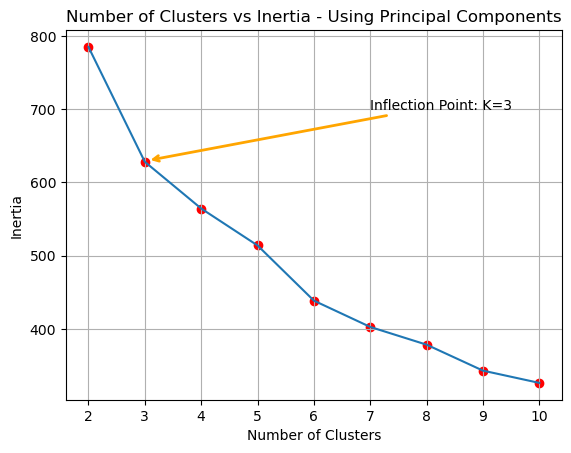

In [69]:
plt.plot(range(2,11), inertia)
plt.scatter(range(2,11),inertia, color='red')
plt.title('Number of Clusters vs Inertia - Using Principal Components')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.grid(True)
plt.annotate('Inflection Point: K=3',
             xy=(3.05,630),
             xytext=(7,700),
             arrowprops = dict(arrowstyle='->', connectionstyle='arc3', color='orange', lw=2))
plt.show()

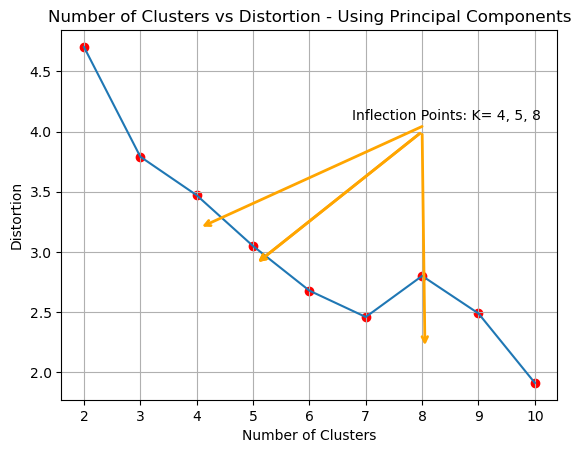

In [70]:
plt.plot(range(2,11), distortion)
plt.scatter(range(2,11),distortion, color='red')
plt.annotate('Inflection Points: K= 4, 5, 8',
              xy=(4.05,3.2),
              xytext=(6.75,4.1),
              arrowprops = dict(arrowstyle='->', connectionstyle='arc3', color='orange', lw=2))
plt.annotate('',
             xy=(5.05,2.9),
             xytext=(8,4),
             arrowprops = dict(arrowstyle='->', connectionstyle='arc3', color='orange', lw=2))
plt.annotate('',
             xy=(5.05,2.9),
             xytext=(8,4),
             arrowprops = dict(arrowstyle='->', connectionstyle='arc3', color='orange', lw=2))
plt.annotate('',
             xy=(8.05,2.2),
             xytext=(8,4),
             arrowprops = dict(arrowstyle='->', connectionstyle='arc3', color='orange', lw=2))
plt.title('Number of Clusters vs Distortion - Using Principal Components')
plt.xlabel('Number of Clusters')
plt.ylabel('Distortion')
plt.grid(True)
plt.show()

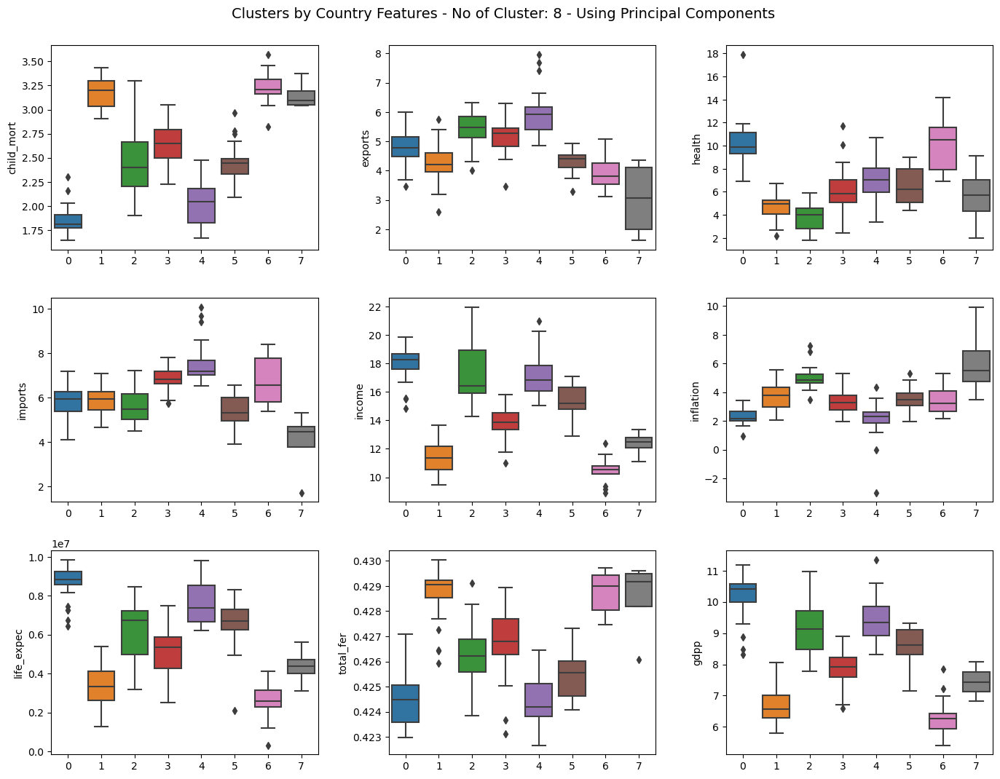

In [71]:
cluster_boxplots(pca_data, bc_data, k=8, add_info=' - Using Principal Components')

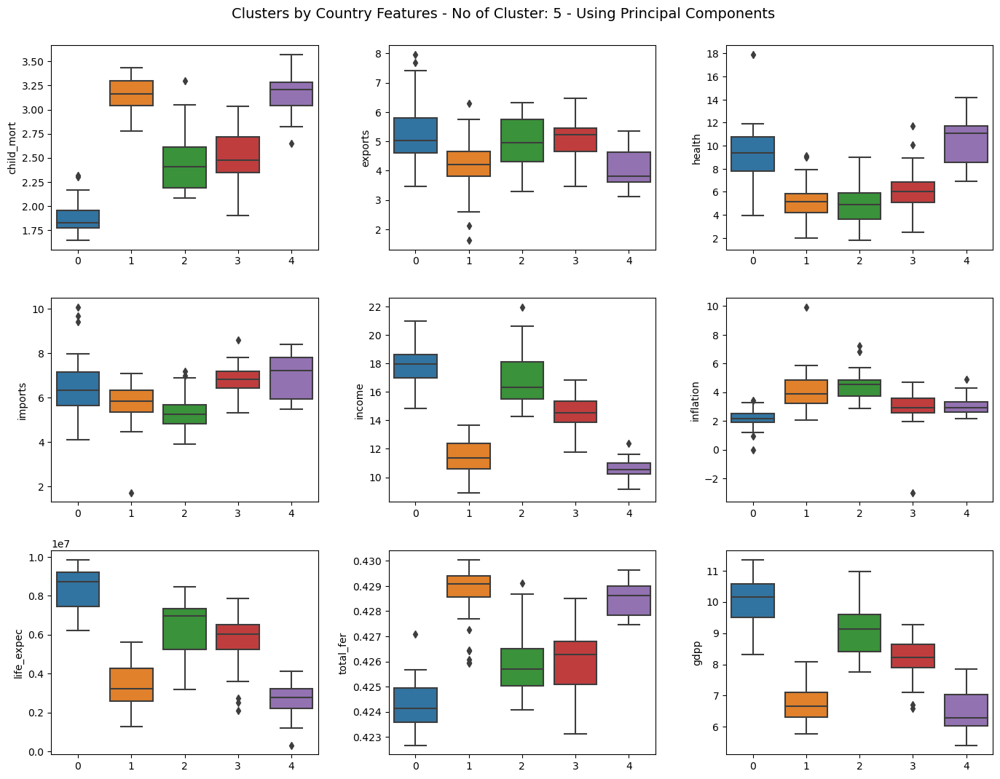

In [72]:
cluster_boxplots(pca_data, bc_data, k=5, add_info=' - Using Principal Components')

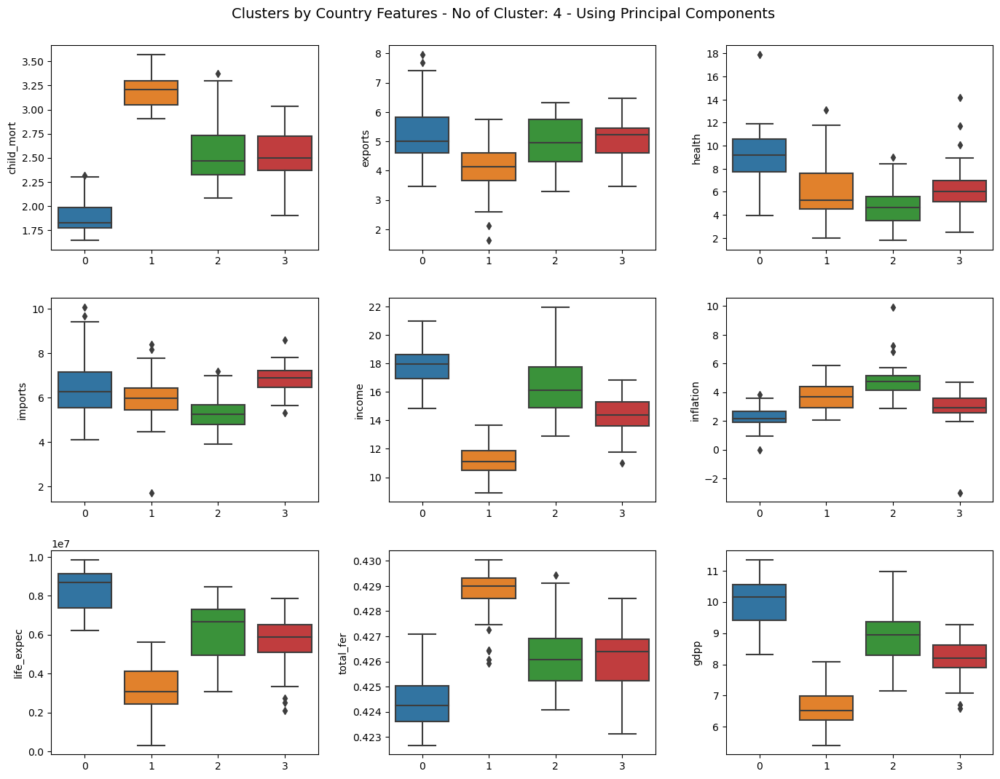

In [73]:
cluster_boxplots(pca_data, bc_data, k=4, add_info=' - Using Principal Components')

1-3 overlaps

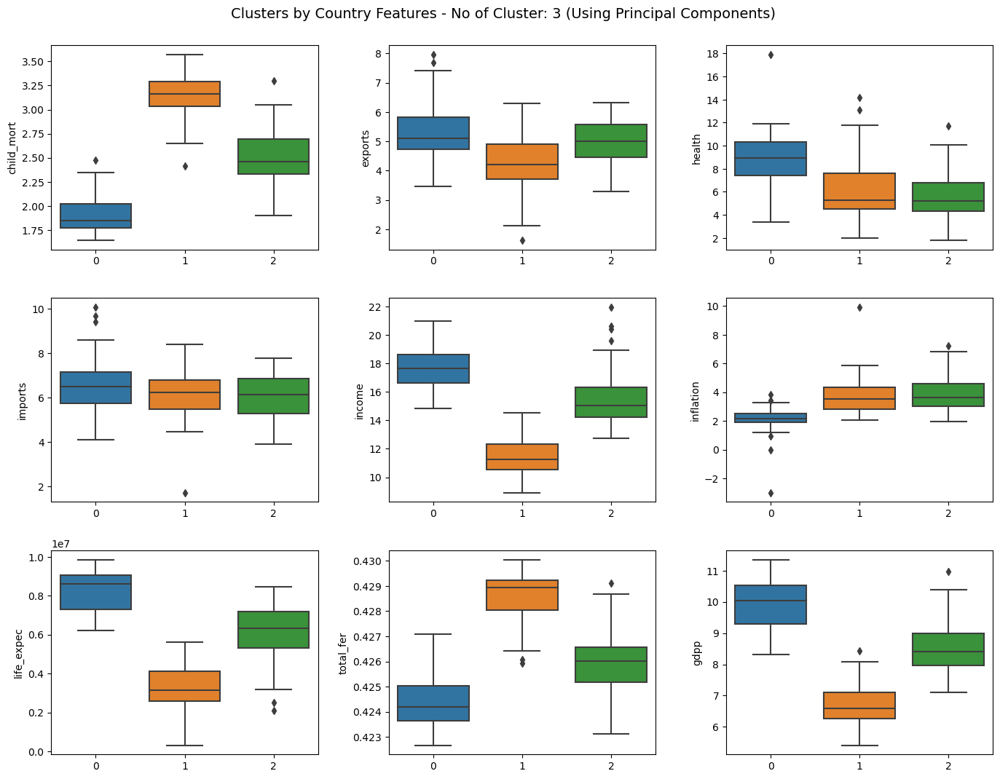

In [74]:
cluster_boxplots(pca_data, bc_data, k=3, add_info=' (Using Principal Components)')

It seems that even when using Principal Component Analysis technique, the best greatest number of clusters to avoid cluster's overlapping is 3. I'll check the Silhouette Score of both models (original number of features vs PCA) to test which one performed better.

In [75]:
silhouette={'Dataset':[], 'Silhouette_Score':[]}
km = KMeans(init='k-means++', n_clusters=3, random_state=98)
km.fit(scaled_ds)
silhouette['Dataset'].append('Original number of features')
silhouette['Silhouette_Score'].append(silhouette_score(scaled_ds, km.labels_))
km.fit(pca_data)
silhouette['Dataset'].append('PCA')
silhouette['Silhouette_Score'].append(silhouette_score(pca_data, km.labels_))
pd.DataFrame(silhouette['Silhouette_Score'], index=silhouette['Dataset'], columns=['Silhouette_Score'])

,Silhouette_Score
Original number of features,0.245922
PCA,0.279659


Reducing the dataset dimensionality using PCA, whilst doesn't produce better results when increasing the number of clusters, achieved a greatest Silhouette Score, when the number of clusters is 3, which means the clusters are better formed.

# Feature Selection

I will choose to retain the features where the distinction between clusters is clearer. Hence, I'll remove the following features due to significant overlap between clusters:

Health
Imports
Inflation
Exports

In [76]:
slct_ds = bc_data.drop(['health', 'imports', 'inflation', 'exports', 'cluster'], axis=1)
slct_ds_scld = StandardScaler().fit_transform(slct_ds)

In [77]:
inertia = []
distortion = []
silhouette = []

for k in range(2,11):
    km = KMeans(init='k-means++', n_clusters=k, random_state=98)
    km.fit(slct_ds_scld)
    inertia.append(km.inertia_)
    distortion.append(distortion_function(k=k, dataset=slct_ds_scld))
    silhouette.append(silhouette_score(slct_ds_scld, km.labels_))

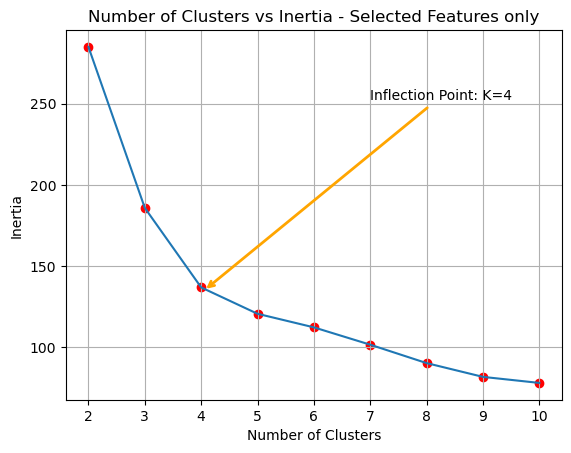

In [78]:
plt.plot(range(2,11), inertia)
plt.scatter(range(2,11),inertia, color='red')
plt.title('Number of Clusters vs Inertia - Selected Features only')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.grid(True)
plt.annotate('Inflection Point: K=4',
              xy=(4.05,135),
              xytext=(7,252),
              arrowprops = dict(arrowstyle='->', connectionstyle='arc3', color='orange', lw=2))
plt.show()

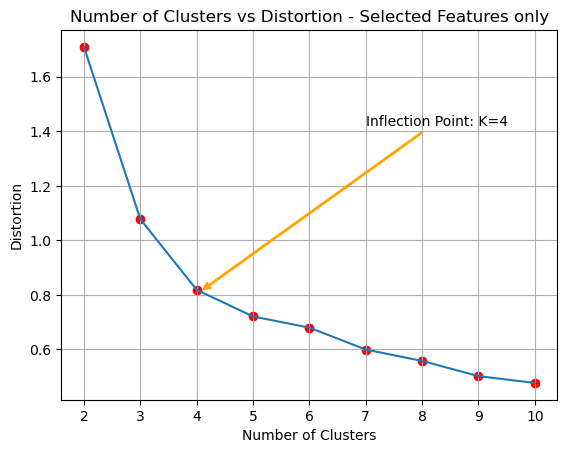

In [79]:
plt.plot(range(2,11), distortion)
plt.scatter(range(2,11),distortion, color='red')
plt.title('Number of Clusters vs Distortion - Selected Features only')
plt.xlabel('Number of Clusters')
plt.ylabel('Distortion')
plt.annotate('Inflection Point: K=4',
              xy=(4.05,0.81),
              xytext=(7,1.42),
              arrowprops = dict(arrowstyle='->', connectionstyle='arc3', color='orange', lw=2))
plt.grid(True)
plt.show()

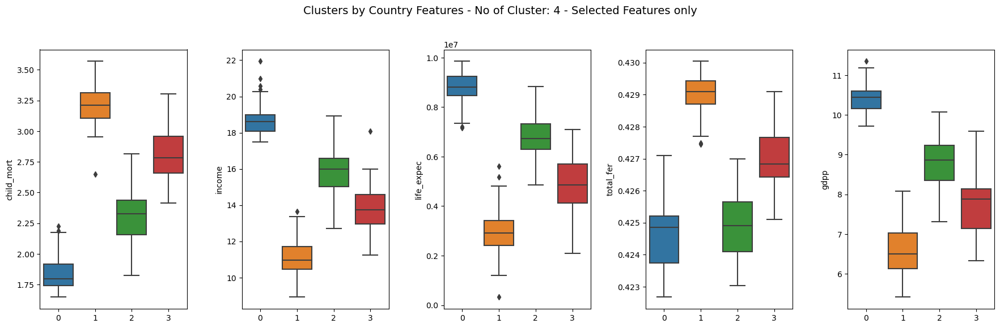

In [80]:
km = KMeans(init='k-means++', n_clusters=4, random_state=98)
km.fit(slct_ds_scld)
slct_ds['cluster'] = km.labels_
    
fig = plt.figure(figsize=(18,6))
child_mort = fig.add_subplot(1,5,1)
income = fig.add_subplot(1,5,2)
life_expec = fig.add_subplot(1,5,3)
total_fer = fig.add_subplot(1,5,4)
gdpp = fig.add_subplot(1,5,5)

sns.boxplot(x='cluster', y='child_mort', data=slct_ds, ax=child_mort)
child_mort.set_xlabel('')

sns.boxplot(x='cluster', y='income', data=slct_ds, ax=income)
income.set_xlabel('')
    
sns.boxplot(x='cluster', y='life_expec', data=slct_ds, ax=life_expec)
life_expec.set_xlabel('')

sns.boxplot(x='cluster', y='total_fer', data=slct_ds, ax=total_fer)
total_fer.set_xlabel('')

sns.boxplot(x='cluster', y='gdpp', data=slct_ds, ax=gdpp)
gdpp.set_xlabel('')
    
fig.suptitle('Clusters by Country Features - No of Cluster: 4 - Selected Features only', fontsize=14)
plt.tight_layout(pad=2)
plt.show()

Pairplot - Number of Cluster: 4 (Selected Features only)


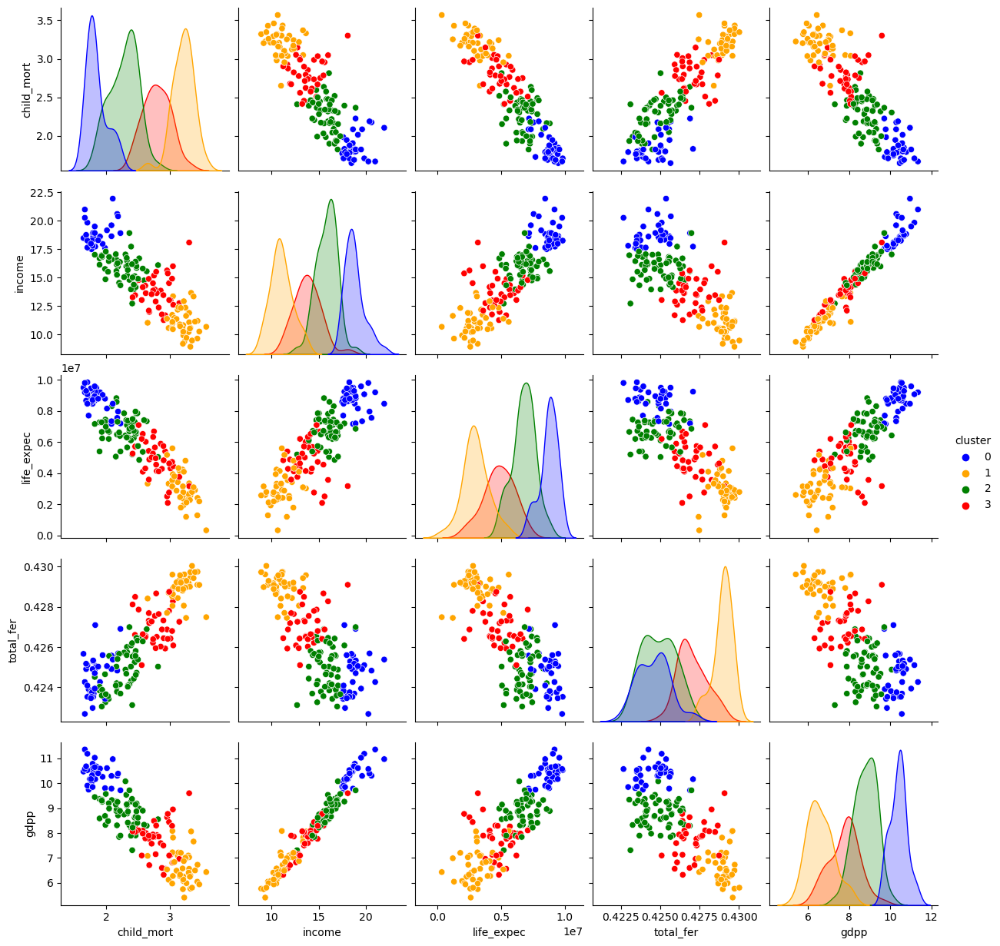

In [81]:
print('Pairplot - Number of Cluster: 4 (Selected Features only)')
sns.pairplot(slct_ds, hue='cluster', palette={0:'blue', 1:'orange', 2:'green', 3:'red'})
plt.show()

# Hierarchical Agglomerative Clustering

I achieved promising results through the application of K-Means and feature selection techniques. K-Means effectively clustered the countries into four distinct groups. Now, I aim to explore whether Hierarchical Agglomerative Clustering, using the same feature set (i.e., only the selected features), can yield improved results by generating four or more non-overlapping clusters.


I'll examine the dendrogram to identify the optimal number of clusters based on the greatest distance gap between clusters. A larger distance indicates more meaningful cluster divisions. I'll focus solely on models suggesting four or more clusters, and then compare the results with the previously trained K-Means algorithm.

##  Hierarchical Agglomerative Clustering with Euclidean Distance 

Linkage: ward - minimizing the intra-cluster inertia

In [82]:
# I define a function to plot the dendrogram from the Hierarchical Agglomerative Clustering algorithm\
## using the dendrogram method available in scipy.

def plot_dendrogram(model, p=50, dend_title='Hierarchical Clustering Dendrogram', size=(16,6), x_line=0, y_line=0, x_text=0,\
                    y_text=0, text=''):
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_, counts]).astype(float)
    plt.figure(figsize=(size))
    den = hierarchy.dendrogram(linkage_matrix, orientation='top', p=p, truncate_mode='lastp', show_leaf_counts=True)
    plt.plot(x_line,y_line, color='orange')
    plt.text(x_text, y_text, text)
    plt.title(dend_title)
    plt.xlabel("Number of points in node (or index of point if no parenthesis).")
    plt.ylabel('Distance')
    plt.show()

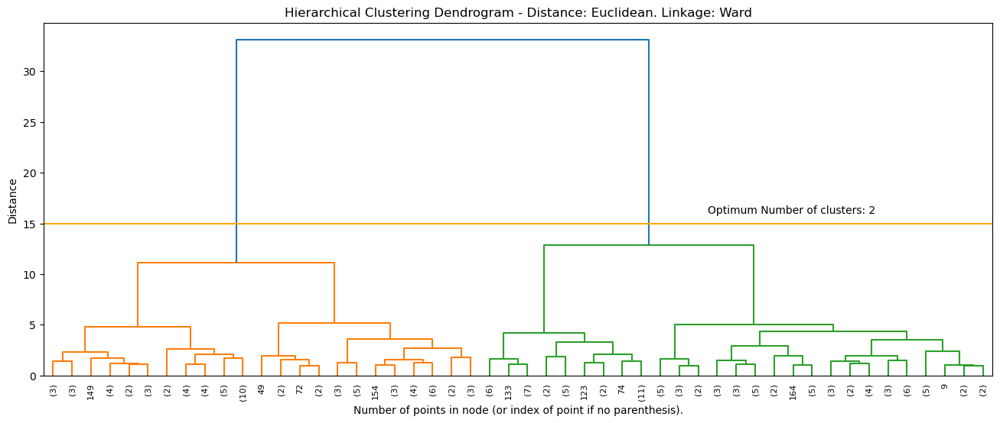

In [83]:
hac = AgglomerativeClustering(n_clusters=None, distance_threshold=0, linkage='ward')
hac.fit(slct_ds_scld)
plot_dendrogram(hac, dend_title='Hierarchical Clustering Dendrogram - Distance: Euclidean. Linkage: Ward', x_line=range(600),
                y_line=np.full((600,), 15), x_text=350, y_text=16, text='Optimum Number of clusters: 2')

Upon examining the dendrogram, it's evident that there's a significant increase in distance when transitioning from 4 to 2 clusters. This suggests that the optimal number of clusters with these parameters (distance: Euclidean; linkage: Ward) is 2.

Given that K-means successfully clustered our data into four distinct groups, it appears that the K-means algorithm outperforms Hierarchical Agglomerative Clustering in partitioning our dataset.

I'll now proceed to explore alternative parameters for the Hierarchical Agglomerative Clustering algorithm.

Linkage: single - insuring clear boundaries between clusters

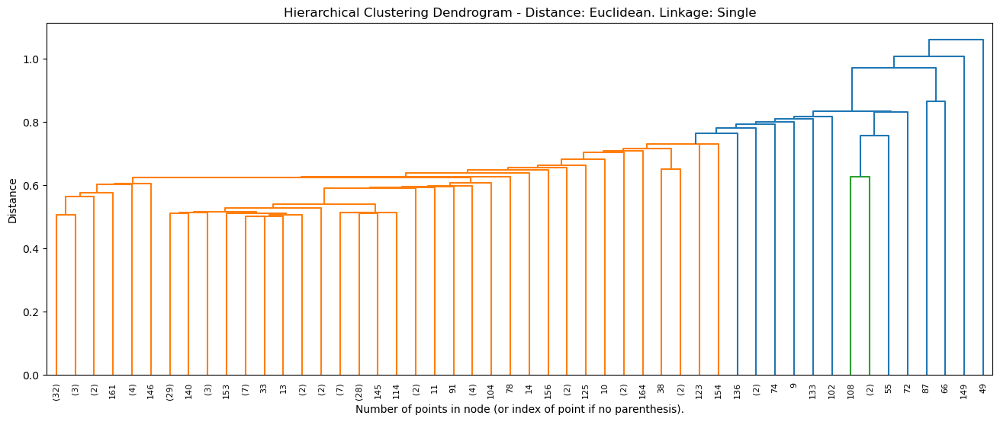

In [84]:
hac = AgglomerativeClustering(n_clusters=None, distance_threshold=0, linkage='single')
hac.fit(slct_ds_scld)
plot_dendrogram(hac, dend_title='Hierarchical Clustering Dendrogram - Distance: Euclidean. Linkage: Single')


Single linkage doesn't perform well at all.

Linkage: complete - reducing the impact of outliers

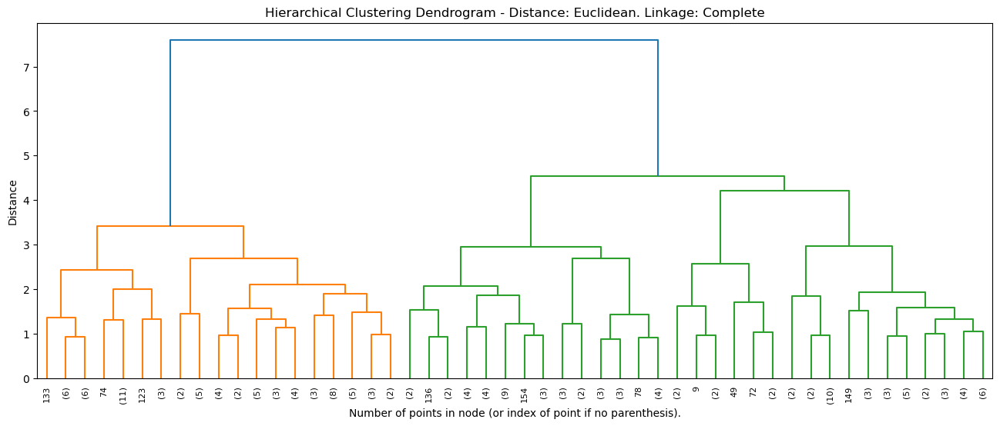

In [85]:
hac = AgglomerativeClustering(n_clusters=None, distance_threshold=0, linkage='complete')
hac.fit(slct_ds_scld)
plot_dendrogram(hac, dend_title='Hierarchical Clustering Dendrogram - Distance: Euclidean. Linkage: Complete')


With Complete linkage the optimum number of clusters is, again, 2.

Linkage: average

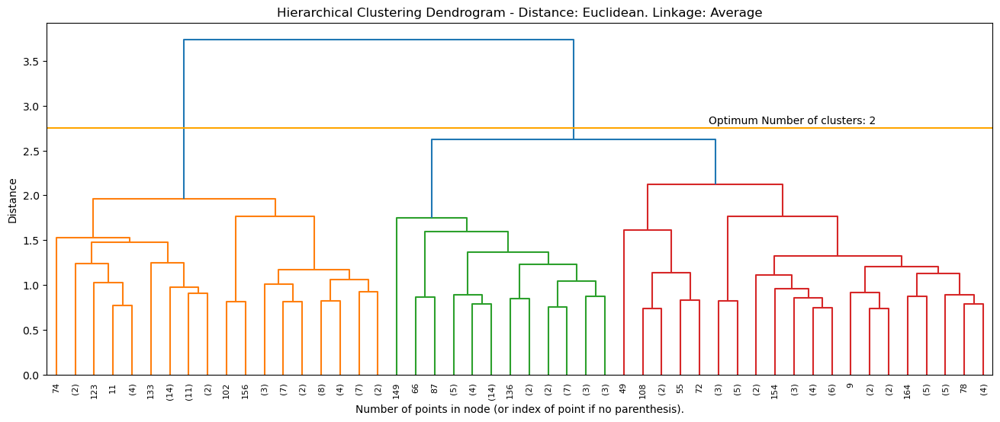

In [86]:
hac = AgglomerativeClustering(n_clusters=None, distance_threshold=0, linkage='average')
hac.fit(slct_ds_scld)
plot_dendrogram(hac, dend_title='Hierarchical Clustering Dendrogram - Distance: Euclidean. Linkage: Average', 
                x_line=range(600), y_line=np.full((600,), 2.75), x_text=350, y_text=2.8, text='Optimum Number of clusters: 2')


With average linkage, we again find that the optimal number of clusters is 2.

Hierarchical agglomerative clustering with Euclidean distance does not outperform K-Means in terms of understanding or segmenting our data. 





# 3. DBSCAN 

I'll now use on the same dataset (using only the selected features) DBSCAN algorithm to see if I can obtain better results, that is 4 or more than 4 not-overlapping clusters.

In [87]:
radius = np.arange(0.5, 10, 0.05)
min_obs = range(5,61)
distances = ['euclidean', 'manhattan']
dbscan_perf = {'Distance':[], 'Radius':[], 'Min_Points':[], 'N_Cluster':[], 'Silhouette_Coefficient':[]}

for d in distances: 
    for r in radius:
        for m in min_obs:
            dbs = DBSCAN(eps=r, min_samples=m, metric=d)
            dbs.fit(slct_ds_scld)
            #bc_data['cluster'] = dbs.labels_
            dbscan_perf['Distance'].append(d)
            dbscan_perf['Radius'].append(r)
            dbscan_perf['Min_Points'].append(m)
            dbscan_perf['N_Cluster'].append(len(np.unique(dbs.labels_)))
            try:
                dbscan_perf['Silhouette_Coefficient'].append(silhouette_score(slct_ds_scld, dbs.labels_))
            except:
                dbscan_perf['Silhouette_Coefficient'].append(np.nan)
    
dbscan_perf = pd.DataFrame(dbscan_perf)

In [88]:
np.sort(dbscan_perf['N_Cluster'].unique())

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10], dtype=int64)

In [89]:
print("Greatest Silhouette Coeffiecient per Number of Clusters:")
dbscan_perf.groupby(['N_Cluster'], as_index=True)[['Silhouette_Coefficient']].max().loc[2:]

Greatest Silhouette Coeffiecient per Number of Clusters:


,Silhouette_Coefficient
N_Cluster,
2,0.479489
3,0.405192
4,0.359300
5,0.270852
6,0.188485
7,0.127782
8,0.029490
9,0.054372
10,-0.093637


DBSCAN returned a maximum of 10 clusters, but when the number of clusters is set to 10, the highest obtained Silhouette Coefficient is negative, suggesting misassignment of samples to clusters. The Silhouette Coefficients for 9 and 8 clusters are very close to 0, implying possible overlap between clusters.

Next, I'll compute the Silhouette Coefficient for the K-Means model with 4 clusters and compare it with the Silhouette Coefficients obtained from DBSCAN.

In [90]:
km = KMeans(init='k-means++', n_clusters=4, random_state=98)
km.fit(slct_ds_scld)
print('K-Means Silhouette Score (4 clusters):', silhouette_score(slct_ds_scld, km.labels_))

K-Means Silhouette Score (4 clusters): 0.3870893735140833


DBSCAN got higher Silhouette Scores only when clusters equal to 2 or 3. Let's have a look at the best 2 and 3 clusters found by DBSCAN.

In [91]:
dbscan_perf[dbscan_perf['N_Cluster'] == 2].sort_values('Silhouette_Coefficient', ascending=False).head(1)

,Distance,Radius,Min_Points,N_Cluster,Silhouette_Coefficient
13719,manhattan,3.2,60,2,0.479489


In [92]:
dbs = DBSCAN(eps=3.2, min_samples=60, metric='manhattan')
dbs.fit(slct_ds_scld)
np.unique(dbs.labels_, return_counts=True)

(array([-1,  0], dtype=int64), array([ 47, 120], dtype=int64))

In [93]:
dbscan_perf[dbscan_perf['N_Cluster'] == 3].sort_values('Silhouette_Coefficient', ascending=False).head(1)

,Distance,Radius,Min_Points,N_Cluster,Silhouette_Coefficient
12970,manhattan,2.55,39,3,0.405192


In [94]:
dbs = DBSCAN(eps=2.55, min_samples=39, metric='manhattan')
dbs.fit(slct_ds_scld)
np.unique(dbs.labels_, return_counts=True)

(array([-1,  0,  1], dtype=int64), array([  4, 119,  44], dtype=int64))

In one of the DBSCAN label configurations, it designates not a typical cluster but rather a group of samples identified as outliers by the algorithm. Hence:

For N_Cluster = 2, there is effectively only 1 cluster, comprising 120 countries, while 47 countries (28% of all samples) are flagged as outliers.
For N_Cluster = 3, there are 2 actual clusters: one with 119 countries and another with 44 countries, along with 4 countries (2.4%) labeled as outliers.
Although DBSCAN yields higher Silhouette Scores for N_Cluster = 2 or 3, forming just 1 or 2 clusters (alongside outliers) adds little value to our analysis. Additionally, K-Means' Silhouette Coefficient (No of Cluster = 4) closely aligns with DBSCAN's Silhouette Coefficient (No of Cluster = 2 + outliers).

In conclusion, K-Means demonstrates superior performance compared to both Agglomerative Hierarchical Clustering and DBSCAN. It successfully partitions our data into 4 distinct clusters using a subset of the original features, chosen based on the analysis of cluster variance/overlap per variable via boxplot examination.






# Results 

In [95]:
# Create the clusters
km = KMeans(init='k-means++', n_clusters=4, random_state=98)
km.fit(slct_ds_scld)
km_cluster = pd.DataFrame(slct_ds_scld, index=slct_ds.index, columns=slct_ds.drop('cluster',axis=1).columns)
km_cluster['cluster'] = km.labels_
km_cluster.tail()

,child_mort,income,life_expec,total_fer,gdpp,cluster
country,,,,,,
Vanuatu,0.272908,-0.936370,-0.989652,0.695901,-0.335557,3
Venezuela,-0.220145,0.444224,0.484259,-0.054573,0.677068,2
Vietnam,0.064298,-0.620702,0.154567,-0.602928,-0.884232,3
Yemen,0.871019,-0.622412,-0.536860,1.227490,-0.884232,3
Zambia,1.212284,-0.857910,-1.779016,1.457080,-0.811543,1


In [96]:
# Reduce the dimension to 2 components to visualize clusters on a 2d plot
pca = PCA(n_components=2)
pca_data = pca.fit_transform(km_cluster.iloc[:,:-1])
pca_data = pd.DataFrame(pca_data, index=slct_ds.index, columns=['1st Principal Component', '2nd Principal Component'])
pca_data['cluster'] = km.labels_
pca_data.head()

,1st Principal Component,2nd Principal Component,cluster
country,,,
Afghanistan,3.214473,0.149480,1
Albania,-0.762240,-0.854788,2
Algeria,-0.146943,0.288264,2
Angola,2.228676,1.275363,1
Antigua and Barbuda,-1.324310,0.088376,2


In [97]:
# Create dataframe for Cluster Cardinality 
cluster_size = km_cluster.groupby(['cluster'], as_index=False)['cluster'].count()
cluster_size.rename(columns={'cluster':'size'}, inplace=True)
cluster_size['cluster'] = [0,1,2,3]
cluster_size

,size,cluster
0,36,0
1,41,1
2,54,2
3,36,3


In [98]:
# Create dataframe for Cluster Magnitude
cluster_magnitude = {'Cluster':[], 'Magnitude':[]}
for c in range(len(km.cluster_centers_)):
    cluster_magnitude['Cluster'].append(c)
    cluster_magnitude['Magnitude'].append(np.sqrt(((km_cluster[km_cluster['cluster']==c].iloc[:,:-1]\
                                                    - km.cluster_centers_[c])**2).sum(axis=1).sum()))
                                 
cluster_magnitude = pd.DataFrame(cluster_magnitude)
cluster_magnitude 

,Cluster,Magnitude
0,0,4.739716
1,1,5.416176
2,2,6.817540
3,3,6.216691


In [99]:
# Create dataframe for Cardinality vs Magnitude
cluster_metric = pd.concat([cluster_magnitude, cluster_size['size']], axis=1)
cluster_metric

,Cluster,Magnitude,size
0,0,4.739716,36
1,1,5.416176,41
2,2,6.817540,54
3,3,6.216691,36


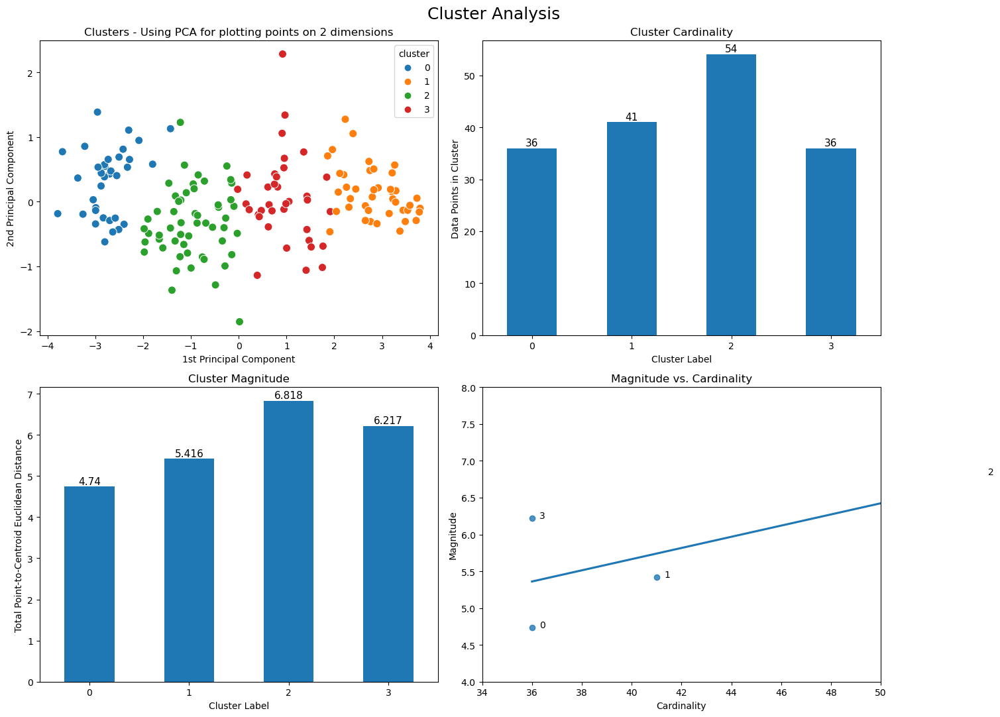

In [100]:
fig = plt.figure(figsize=(15,11))
clusters = fig.add_subplot(2,2,1)
cardinality = fig.add_subplot(2,2,2)
magnitude = fig.add_subplot(2,2,3)
metric = fig.add_subplot(2,2,4)

sns.scatterplot(data=pca_data, x='1st Principal Component', y='2nd Principal Component', hue='cluster',
                 palette='tab10', s=75, ax=clusters)
clusters.set_title('Clusters - Using PCA for plotting points on 2 dimensions')
clusters.set_xlabel('1st Principal Component')
clusters.set_ylabel('2nd Principal Component')

barchart = cluster_size.plot(x='cluster', y='size', kind='bar', legend=False, ax=cardinality)
for i in barchart.patches:
    barchart.annotate(round(i.get_height(),3), # get the frequency of the variable categories
                      xy = (i.get_x() + i.get_width()/2, i.get_height()*1.005), # set the coordinates for each label
                      ha='center', # set the horizontal alignment
                      va='top', # set the vertical alignment
                      xytext=(0,10), # default
                      textcoords='offset points', # default
                      fontsize=11) # set the font size
cardinality.set_title('Cluster Cardinality')
cardinality.set_xlabel('Cluster Label')
cardinality.set_ylabel('Data Points in Cluster')
cardinality.tick_params(axis='x', rotation=0)

barchart = cluster_magnitude.plot(x='Cluster', y='Magnitude', kind='bar', legend=False, ax=magnitude)
for i in barchart.patches:
    barchart.annotate(round(i.get_height(),3), # get the frequency of the variable categories
                      xy = (i.get_x() + i.get_width()/2, i.get_height()*1.005), # set the coordinates for each label
                      ha='center', # set the horizontal alignment
                      va='top', # set the vertical alignment
                      xytext=(0,10), # default
                      textcoords='offset points', # default
                      fontsize=11) # set the font size
magnitude.set_title('Cluster Magnitude')
magnitude.set_xlabel('Cluster Label')
magnitude.set_ylabel('Total Point-to-Centroid Euclidean Distance')
magnitude.tick_params(axis='x', rotation=0)

sns.regplot(x='size', y='Magnitude', data=cluster_metric, ci=None, ax=metric)
for c in cluster_metric['Cluster']:
    plt.text(cluster_metric.loc[c]['size']+0.3, cluster_metric.loc[c]['Magnitude'], c)
metric.set_xlim(34,50)
metric.set_ylim(4,8)
metric.set_title('Magnitude vs. Cardinality')
metric.set_xlabel('Cardinality')
metric.set_ylabel('Magnitude')

fig.suptitle('Cluster Analysis', fontsize=18)
plt.tight_layout()
plt.show()

Result and major findings:

All 4 clusters are relatively evenly sized, indicating a lack of significant outliers in terms of observation counts per cluster.

Cluster 1 stands out as the smallest cluster both in terms of size and overall distance of its examples from the cluster centroid.

Typically, higher cluster sizes correlate with greater overall distances from examples to the cluster centroid—a logical expectation. However, upon examining the Magnitude vs. Cardinality Regression Plot, it becomes evident that the relationship between Cluster 0's size and distance from the centroid diverges from the expected pattern. Cluster 0 exhibits the highest 
magnitude despite not being the largest cluster.

The anomaly observed in Cluster 0's relationship between size and distance from the centroid is likely attributable to the presence of an outlier, which significantly inflates the cluster's overall distance from the centroid.





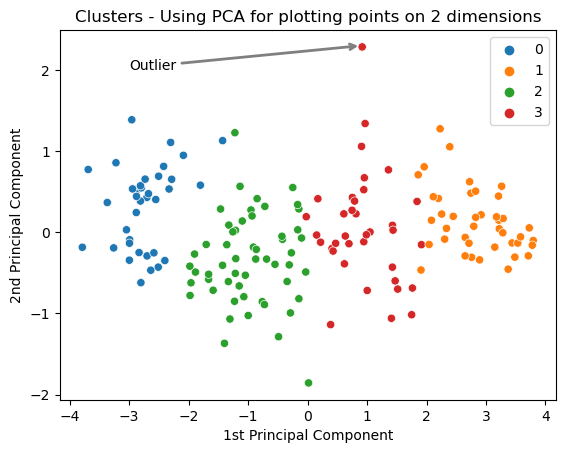

In [101]:
sns.scatterplot(data=pca_data, x='1st Principal Component', y='2nd Principal Component', hue='cluster',
                 palette='tab10')
plt.legend(loc='best')
plt.annotate('Outlier',
              xy=(0.9,2.3),
              xytext=(-3,2),
              arrowprops = dict(arrowstyle='->', connectionstyle='arc3', color='gray', lw=2))
plt.title('Clusters - Using PCA for plotting points on 2 dimensions')
plt.xlabel('1st Principal Component')
plt.ylabel('2nd Principal Component')
plt.show()

In [102]:
#Let's have a look at the outlier - Cluster 0
pca_data[pca_data['2nd Principal Component'] > 2].index

Index(['Equatorial Guinea'], dtype='object', name='country')


In addition to the slight anomaly observed in Cluster 0 compared to the others, it can be concluded that K-Means effectively segmented the data points into 4 distinct clusters.

# Discussion

In [103]:
import plotly.graph_objects as go
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler

In [104]:
#cluster characteristics with a radarplot
import plotly.graph_objects as go

attributes = km_cluster.columns[:5]

fig = go.Figure()

fig.add_trace(go.Scatterpolar(r=np.mean(km_cluster.loc[km_cluster.cluster == 0, attributes]),
                              theta=attributes,
                              fill='toself',
                              fillcolor='blue',
                              opacity=0.4,
                              name='Cluster 0'))
fig.add_trace(go.Scatterpolar(r=np.mean(km_cluster.loc[km_cluster.cluster == 1, attributes]),
                              theta=attributes,
                              fill='toself',
                              fillcolor='orange',
                              opacity=0.4,
                              name='Cluster 1'))
fig.add_trace(go.Scatterpolar(r=np.mean(km_cluster.loc[km_cluster.cluster == 2, attributes]),
                              theta=attributes,
                              fill='toself',
                              fillcolor='green',
                              opacity=0.4,
                              name='Cluster 2'))
fig.add_trace(go.Scatterpolar(r=np.mean(km_cluster.loc[km_cluster.cluster == 3, attributes]),
                              theta=attributes,
                              fill='toself',
                              fillcolor='red',
                              opacity=0.4,
                              name='Cluster 3'))

fig.update_layout(polar=dict(radialaxis=dict(visible=True)),showlegend=True,
                  title="Radar plot - Cluster attributes (Normalized Values)")
fig.show()

Cluster 1: Comprises countries exhibiting the highest values in Income, Life Expectancy, and GDP per capita, along with the lowest values in Child Mortality and Total Fertility. These nations can be categorized as "Highly Developed".

Cluster 3: Encompasses countries with lower values in Income, Life Expectancy, and GDP per capita compared to the Highly Developed group, yet still above the overall dataset average. Moreover, they demonstrate higher values in Child Mortality and Total Fertility than Cluster 1 but remain below the dataset average. These countries can be classified as "Upper-middle Developed".

Cluster 0: Represents countries with mean values in Income, Life Expectancy, and GDP per capita below the dataset average, alongside mean values in Child Mortality and Total Fertility above the average. These nations are aptly labeled as "Lower-middle Developed".

Cluster 2: Consists of countries exhibiting the highest values in Child Mortality and Total Fertility, coupled with the smallest values in Income, Life Expectancy, and GDP per capita. These countries are denoted as the "Least Developed".






In [105]:
country_ds['cluster'] = km.labels_
country_ds['label'] = None

country_ds.loc[country_ds['cluster'] == 0, 'label'] = 'Lower-middle developed'
country_ds.loc[country_ds['cluster'] == 1, 'label'] = 'Highly developed'
country_ds.loc[country_ds['cluster'] == 2, 'label'] = 'Least developed'
country_ds.loc[country_ds['cluster'] == 3, 'label'] = 'Upper-middle developed'
country_ds.head()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,cluster,label
country,,,,,,,,,,,
Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,1,Highly developed
Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,2,Least developed
Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,2,Least developed
Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,1,Highly developed
Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,2,Least developed


In [106]:
cluster_ds = country_ds.groupby(['cluster','label'], as_index=True).mean()
cluster_ds.T

cluster,0,1,2,3
label,Lower-middle developed,Highly developed,Least developed,Upper-middle developed
child_mort,5.130556,96.114634,14.274074,41.525000
exports,58.444444,26.000244,42.337037,39.138583
health,8.640556,6.456829,6.694630,5.581111
imports,50.475000,43.756098,46.574074,47.349053
income,46230.555556,2077.146341,15650.555556,7460.277778
inflation,3.091111,11.573293,7.197407,9.031139
life_expec,80.144444,59.043902,74.727778,67.819444
total_fer,1.793611,5.180244,1.919444,3.102778
gdpp,42569.444444,994.146341,8663.148148,3442.888889


In [107]:
cluster_ds.describe().T

,count,mean,std,min,25%,50%,75%,max
child_mort,4.0,39.261066,40.933666,5.130556,11.988194,27.899537,55.172409,96.114634
exports,4.0,41.480077,13.337066,26.000244,35.853998,40.737810,46.363889,58.444444
health,4.0,6.843281,1.290311,5.581111,6.237900,6.575729,7.181111,8.640556
imports,4.0,47.038556,2.762597,43.756098,45.869580,46.961563,48.130540,50.475000
income,4.0,17854.633808,19723.274272,2077.146341,6114.494919,11555.416667,23295.555556,46230.555556
inflation,4.0,7.723238,3.571490,3.091111,6.170833,8.114273,9.666677,11.573293
life_expec,4.0,70.433892,9.115911,59.043902,65.625559,71.273611,76.081944,80.144444
total_fer,4.0,2.999019,1.569182,1.793611,1.887986,2.511111,3.622144,5.180244
gdpp,4.0,13917.406956,19367.263458,994.146341,2830.703252,6053.018519,17139.722222,42569.444444


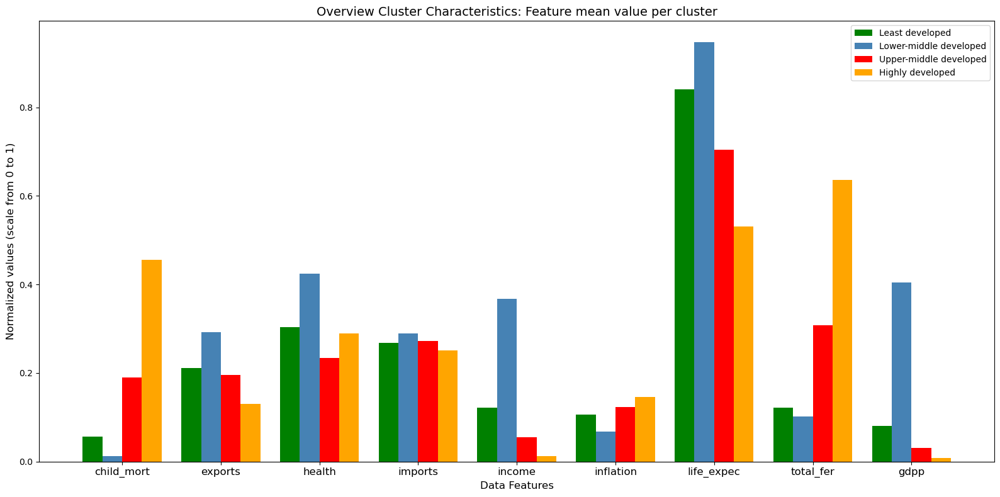

In [108]:
#Normalize the values with MinMax Scaler to plot features by cluster as clustered bar chart.
country_ds_norm = pd.DataFrame(MinMaxScaler().fit_transform(country_ds[country_ds.columns[:-2]]),
                               columns=country_ds.columns[:-2])
country_ds_norm['cluster'] = km.labels_

group_ds = country_ds_norm.groupby(['cluster'], as_index=True).mean()
labels = cluster_ds.columns
cluster_0 = np.ravel(group_ds.loc[0].values)
cluster_1 = np.ravel(group_ds.loc[1].values)
cluster_2 = np.ravel(group_ds.loc[2].values)
cluster_3 = np.ravel(group_ds.loc[3].values)

x = np.arange(len(labels))  # the label locations
width = 0.2  # the width of the bars

fig, ax = plt.subplots(figsize=(16,8))
rects1 = ax.bar(x - width*1.5, cluster_2, width, label='Least developed', color='green')
rects2 = ax.bar(x - width/2, cluster_0, width, label='Lower-middle developed', color='steelblue')
rects3 = ax.bar(x + width/2, cluster_3, width, label='Upper-middle developed', color='red')
rects4 = ax.bar(x + width*1.5, cluster_1, width, label='Highly developed', color='orange')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Normalized values (scale from 0 to 1)', fontsize=12)
ax.set_xlabel('Data Features', fontsize=12)
ax.set_title('Overview Cluster Characteristics: Feature mean value per cluster', fontsize=14)
ax.set_xticks(x, labels, fontsize=12)
ax.legend()

fig.tight_layout()
plt.show()

Key Observations:

The identified clusters shed light on patterns even in features not utilized in training the clustering algorithm, such as Exports, Imports, and Inflation:

1. A trend emerges where more developed countries tend to exhibit a higher percentage of both Imports and Exports relative to GDP per capita.

2. Notably, the Highly Developed cluster stands out with Export values surpassing Import values, suggesting a positive trade balance characteristic of well-developed economies. This prompts consideration for Hypothesis Testing Analysis to ascertain the statistical significance of this disparity compared to the population average.

Interestingly, Inflation levels seem to decrease as countries become more developed.

Health expenditure, represented by total spending per capita as a percentage of GDP per capita, does not appear to influence the clustering or be influenced by it.

Significant disparities exist between clusters, particularly evident in certain features:

1. The Least Developed Countries exhibit alarmingly high levels of Child Mortality and Total Fertility compared to other clusters, indicating 95 children per 1,000 live births and 5.12 newborns per woman, respectively, contrasting starkly with inter-cluster averages.

2. This underscores a critical action point for NGOs to address: reducing Child Mortality rates can lead to a reduction in Total Fertility as well, thereby narrowing the developmental gap between this cluster and others.

Highly Developed countries demonstrate substantially higher GDPP and Income compared to other clusters:

1. With a GDPP of 43,234 USD and Income mean value of 46,257 USD per person, these countries starkly contrast with inter-cluster averages.

2. This highlights the prevailing global disparity where prosperity and high living standards remain concentrated, underscoring the importance for NGOs to focus efforts on reducing Child Mortality rates in the Least Developed countries and advocating policies conducive to economic growth.

Actionable steps for NGOs include initiatives to:

1. Reduce trade deficits.
2. Manage inflation levels.
3. Implement effective fiscal and monetary policies.
4. Encourage privatization.
5. Foster free trade agreements.
6. Enhance education systems and local infrastructure.
7. Boost real wages while maintaining inflation control.





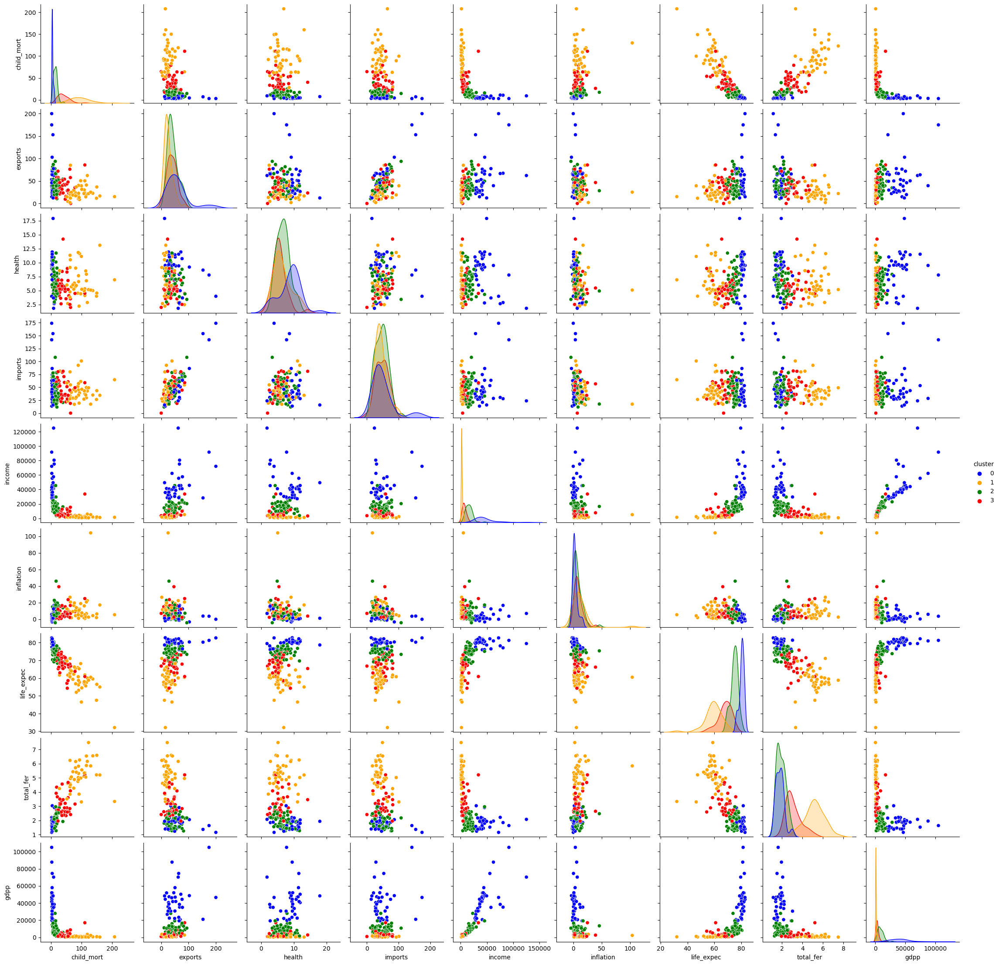

In [109]:
sns.pairplot(country_ds, hue='cluster', palette={0:'blue', 1:'orange', 2:'green', 3:'red'})
plt.show()

# Conclusion 

### Summary

The objective of this project is to utilize unsupervised Machine Learning Clustering models (K-Means, Hierarchical Agglomerative Clustering, and DBSCAN) to accurately classify countries worldwide into clusters, enabling an assessment of their developmental status. The project aims to assist NGOs in strategically allocating their funds to support countries at the bottom of the development curve.

Project Phases:

1. Data Preparation and Analysis:

The dataset underwent cleaning and analysis, revealing no duplicates or missing values.

Outliers were identified but deemed natural and retained within the data.

While 8 out of 9 features were not normally distributed, BoxCox transformation was employed to normalize the data distribution and strengthen correlations between features.

Following transformation, the data was standardized using Scikit-Learn's Standard Scaler to ensure consistency across variables.

2. Model Training and Evaluation:

K-Means algorithm was first trained to determine the optimal number of clusters, with performance compared across different feature sets:

All dataset features were initially utilized.

Principal Component Analysis (PCA) was applied to reduce the number of variables.

Feature selection was conducted based on empirical analysis, retaining only features showcasing significant differences between clusters.

K-Means was then trained using the selected features, proving to effectively cluster data points into 4 distinct groups.

Hierarchical Agglomerative Clustering and DBSCAN models were subsequently trained using the selected features, with performance compared across different distance metrics (Euclidean and Manhattan distances for Hierarchical Agglomerative Clustering) and hyperparameter values (for DBSCAN).

3. Model Outputs:

K-Means outperformed both Agglomerative Hierarchical Clustering and DBSCAN, successfully clustering data points into 4 distinct groups using a refined subset of original features. This achievement was facilitated by analyzing cluster differences/overlap for each variable through boxplot analysis during feature selection.

### Analysis Outcome: 


K-Means clustering revealed distinct categories among the 167 countries in the dataset:

Cluster 1 - Highly Developed:

Characterized by the highest values in Income, Life Expectancy, and GDP per capita.
Exhibits the lowest values in Child Mortality and Total Fertility.

Cluster 3 - Upper-Middle Developed:

Features Income, Life Expectancy, and GDP per capita mean values lower than those in Cluster 1 but still above the dataset average.
Shows higher values in Child Mortality and Total Fertility compared to Cluster 1 but below the dataset average.

Cluster 0 - Lower-Middle Developed:

Countries with Income, Life Expectancy, and GDP per capita mean values below the dataset average.
Demonstrates higher values in Child Mortality and Total Fertility compared to the dataset average.

Cluster 2 - Least Developed:

Exhibits the highest values in Child Mortality and Total Fertility among all clusters.
Features the lowest values in Income, Life Expectancy, and GDP per capita.

In [110]:
# Prepare data for Geo visualization
km_cluster['cluster_label'] = None
km_cluster.loc[km_cluster['cluster'] == 0, 'cluster_label'] = 'Lower-Middle Developed'
km_cluster.loc[km_cluster['cluster'] == 1, 'cluster_label'] = 'Highly Developed'
km_cluster.loc[km_cluster['cluster'] == 2, 'cluster_label'] = 'Least Developed'
km_cluster.loc[km_cluster['cluster'] == 3, 'cluster_label'] = 'Upper-Middle Developed'

# Display a Choropleth Map with plotly.express
country_info = r'world_countries.json'
fig = px.choropleth_mapbox(km_cluster,
                           geojson=country_info,
                           featureidkey='properties.name',
                           locations=km_cluster.index,
                           color='cluster_label',
                           labels={'cluster_label': ''},
                           category_orders={'cluster_label': ['Least developed',
                                                              'Lower-middle developed',
                                                              'Upper-middle developed',
                                                              'Highly developed']},
                           color_discrete_map={'Least Developed': 'darkred',
                                               'Lower-Middle Developed': 'red',
                                               'Upper-Middle Developed': 'lightblue',
                                               'Highly Developed': "steelblue"},
                           opacity=0.8,
                           mapbox_style="carto-positron",
                           zoom=0.85,
                           center = {"lat": 40.2085, "lon": -3.7135},
                           title='')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0},
                  legend=dict(orientation="h", yanchor="top", y=1.06, xanchor="left", x=-0.05))
fig.show()

In [111]:
def cluster_descr(cluster):
    print('List of {} countries:'.format(km_cluster[km_cluster['cluster'] == cluster]['cluster_label'].values[0]))
    print(km_cluster[km_cluster['cluster'] == cluster].index.tolist())
    print('')
    print('Number of {} countries: '.format(km_cluster[km_cluster['cluster'] == cluster]['cluster_label'].values[0]),
          len(km_cluster[km_cluster['cluster'] == cluster].index))
    
cluster_descr(1)

List of Highly Developed countries:
['Afghanistan', 'Angola', 'Benin', 'Burkina Faso', 'Burundi', 'Cameroon', 'Central African Republic', 'Chad', 'Comoros', 'Congo, Dem. Rep.', 'Congo, Rep.', "Cote d'Ivoire", 'Eritrea', 'Gambia', 'Ghana', 'Guinea', 'Guinea-Bissau', 'Haiti', 'Kenya', 'Kiribati', 'Lesotho', 'Liberia', 'Madagascar', 'Malawi', 'Mali', 'Mauritania', 'Mozambique', 'Niger', 'Nigeria', 'Pakistan', 'Rwanda', 'Senegal', 'Sierra Leone', 'Solomon Islands', 'Sudan', 'Tajikistan', 'Tanzania', 'Timor-Leste', 'Togo', 'Uganda', 'Zambia']

Number of Highly Developed countries:  41


In [112]:
cluster_descr(3)

List of Upper-Middle Developed countries:
['Bangladesh', 'Belize', 'Bhutan', 'Bolivia', 'Botswana', 'Cambodia', 'Cape Verde', 'Dominican Republic', 'Egypt', 'Equatorial Guinea', 'Fiji', 'Gabon', 'Guatemala', 'Guyana', 'India', 'Indonesia', 'Iraq', 'Jordan', 'Kyrgyz Republic', 'Lao', 'Micronesia, Fed. Sts.', 'Mongolia', 'Morocco', 'Myanmar', 'Namibia', 'Nepal', 'Paraguay', 'Philippines', 'Samoa', 'South Africa', 'Tonga', 'Turkmenistan', 'Uzbekistan', 'Vanuatu', 'Vietnam', 'Yemen']

Number of Upper-Middle Developed countries:  36


In [113]:
cluster_descr(0)

List of Lower-Middle Developed countries:
['Australia', 'Austria', 'Bahrain', 'Belgium', 'Brunei', 'Canada', 'Cyprus', 'Czech Republic', 'Denmark', 'Finland', 'France', 'Germany', 'Greece', 'Iceland', 'Ireland', 'Israel', 'Italy', 'Japan', 'Kuwait', 'Luxembourg', 'Malta', 'Netherlands', 'New Zealand', 'Norway', 'Oman', 'Portugal', 'Qatar', 'Singapore', 'Slovenia', 'South Korea', 'Spain', 'Sweden', 'Switzerland', 'United Arab Emirates', 'United Kingdom', 'United States']

Number of Lower-Middle Developed countries:  36


In [114]:
print('These are the countries at the bottom of the development curve:')
cluster_descr(2)

These are the countries at the bottom of the development curve:
List of Least Developed countries:
['Albania', 'Algeria', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Azerbaijan', 'Bahamas', 'Barbados', 'Belarus', 'Bosnia and Herzegovina', 'Brazil', 'Bulgaria', 'Chile', 'China', 'Colombia', 'Costa Rica', 'Croatia', 'Ecuador', 'El Salvador', 'Estonia', 'Georgia', 'Grenada', 'Hungary', 'Iran', 'Jamaica', 'Kazakhstan', 'Latvia', 'Lebanon', 'Libya', 'Lithuania', 'Macedonia, FYR', 'Malaysia', 'Maldives', 'Mauritius', 'Moldova', 'Montenegro', 'Panama', 'Peru', 'Poland', 'Romania', 'Russia', 'Saudi Arabia', 'Serbia', 'Seychelles', 'Slovak Republic', 'Sri Lanka', 'St. Vincent and the Grenadines', 'Suriname', 'Thailand', 'Tunisia', 'Turkey', 'Ukraine', 'Uruguay', 'Venezuela']

Number of Least Developed countries:  54


## Future Directions 

1. Inclusion of Additional Countries: Expanding the analysis to include countries not present in the dataset could provide a more comprehensive understanding of global development trends and aid in identifying emerging patterns.

2. Trade Balance Analysis: Given that the "Highly Developed Countries" cluster exhibits a positive trade balance, conducting Hypothesis Testing Analysis to evaluate the statistical significance of this difference compared to the population average could offer insights into the economic dynamics of highly developed nations.

3. Incorporation of More Features: Considering additional significant features beyond those initially selected for clustering could enhance the granularity of the clusters and provide deeper insights into the underlying factors driving development disparities among countries.

4. Longitudinal Analysis: Establishing a longitudinal dataset and conducting periodic analyses over time would enable the tracking of countries' status changes and the identification of key drivers behind such transformations. This longitudinal approach would offer valuable insights into the dynamic nature of global development trends.


                                          Submitted By : Shweta Kanungo